# State-of-the-Art PINNs for 4D-STEM Strain Reconstruction

## Data Efficiency with Physics-Informed Adaptive Learning

**Goal**: Reconstruct high-fidelity strain maps (e_xx, e_yy, e_xy, θ) using only **1%–75%** of 4D-STEM measurement data.

### Key Innovations

1. **SIREN Architecture**: Sine-activated residual encoding networks with proper weight initialization
2. **Adaptive Loss Balancing**: GradNorm-based dynamic weighting of data vs. physics terms
3. **Residual-Based Adaptive Refinement (RAR)**: Intelligently augment training set in high-error regions
4. **Physics Constraints**: Enforce linear elasticity equilibrium (div(σ)=0) as soft loss
5. **Multi-Sampling Strategy**: Compare 1%, 5%, 10%, 25%, 50%, 75% data utilization

### References
- [Curriculum-Enhanced Adaptive Sampling for PINNs](https://www.mdpi.com/2227-7390/13/24/3996)
- [Annealed Adaptive Importance Sampling (AAIS)](https://arxiv.org/abs/2405.03433)
- [R-PINN: Recovery-type Error Estimators](https://arxiv.org/html/2506.10243)
- [Failure-Informed Adaptive Sampling](https://epubs.siam.org/doi/10.1137/22M1527763)
- [Investigating Guiding Information for Adaptive Sampling](https://arxiv.org/html/2404.12282v1)


In [1]:
# ============================================================================
# SECTION 1: Environment Setup & Configuration
# ============================================================================
import sys
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import csv
import time
from tqdm import trange
from collections import defaultdict
import pandas as pd

# Versions
print(f"Python: {sys.version.split()[0]}")
print(f"NumPy: {np.__version__}")
print(f"PyTorch: {torch.__version__}")

# Device selection (prefer Apple MPS, then CUDA, then CPU)
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("✓ Using Apple Metal Performance Shaders (MPS)")
elif torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"✓ Using CUDA: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")
    print("⚠ Using CPU (slow!)")

# Reproducibility
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)

# Plotting defaults
plt.rcParams.update({
    "figure.figsize": (12, 8),
    "image.cmap": "RdBu",
    "axes.grid": False,
    "font.size": 11,
})

print("\n" + "="*70)
print("CONFIGURATION: STATE-OF-THE-ART PINN FOR STRAIN RECONSTRUCTION")
print("="*70)

Python: 3.10.15
NumPy: 1.26.4
PyTorch: 2.5.1
✓ Using Apple Metal Performance Shaders (MPS)

CONFIGURATION: STATE-OF-THE-ART PINN FOR STRAIN RECONSTRUCTION


In [2]:
# Comprehensive Configuration Dictionary
config = {
    # --- DATA & GRID ---
    "sampling_fractions": [0.01, 0.05, 0.10, 0.25, 0.50, 0.75],
    "full_data_training": False,  # Include 100% as well?
    
    # --- MATERIAL PROPERTIES (Si-SiGe) ---
    "E": 150e9,        # Young's modulus (Pa)
    "nu": 0.27,        # Poisson's ratio
    
    # --- LOSS WEIGHTING ---
    "w_data": 1.0,              # Data loss weight
    "w_physics": 0.01,          # Physics loss weight
    "w_data_init": 1.0,
    "w_physics_init": 0.01,     # Start low, ramp up
    "w_physics_max": 0.1,
    "loss_balance_method": "fixed",  # "gradnorm", "self_adaptive", or "fixed"
    "normalize_physics_by_E": True,
    
    # --- ARCHITECTURE ---
    "architecture": "siren",     # "siren", "fourier", or "standard"
    "hidden_dim": 128,
    "num_layers": 6,
    "skip_connections": True,
    "use_multiplicative_filter": False,
    
    # --- TRAINING (per sampling fraction) ---
    "epochs": 5000,
    "lr": 1e-3,
    "lr_decay_factor": 0.95,
    "lr_decay_interval": 500,
    "early_stop": True,
    "patience": 400,
    "min_delta": 1e-6,
    
    # --- ADAPTIVE REFINEMENT (RAR) ---
    "enable_rar": True,
    "rar_trigger_epoch": 2000,      # Start RAR after this many epochs
    "rar_num_new_points_pct": 0.10,  # Add 10% of training set from high-residual regions
    "rar_residual_percentile": 90,   # Use top 10% residuals
    
    # --- OUTPUTS ---
    "out_dir": "outputs/sota_adaptive-2",
    "save_checkpoints": True,
    "verbose": True,
    
    # --- VALIDATION ---
    "compute_full_domain_error": True,
}

# Create output directory
out_dir = Path(config["out_dir"]).resolve()
out_dir.mkdir(parents=True, exist_ok=True)

# Print configuration nicely
print("\n▶ SAMPLING FRACTIONS:", config["sampling_fractions"])
print("▶ ARCHITECTURE:", config["architecture"].upper())
print(f"▶ HIDDEN DIM: {config['hidden_dim']}, NUM LAYERS: {config['num_layers']}")
print(f"▶ LOSS BALANCE: {config['loss_balance_method'].upper()}")
print(f"▶ ENABLE RAR: {config['enable_rar']}")
print(f"▶ OUTPUTS: {out_dir}")
print("="*70)


▶ SAMPLING FRACTIONS: [0.01, 0.05, 0.1, 0.25, 0.5, 0.75]
▶ ARCHITECTURE: SIREN
▶ HIDDEN DIM: 128, NUM LAYERS: 6
▶ LOSS BALANCE: FIXED
▶ ENABLE RAR: True
▶ OUTPUTS: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2


In [3]:
# ============================================================================
# SECTION 2: Load & Visualize 4D-STEM Strain Data (SEPARATE FILES)
# ============================================================================

# Load separate strain component files
root = Path.cwd()
data_candidates = [
    (root / 'data' / 'strain_exx.npy', root / 'data' / 'strain_exy.npy', root / 'data' / 'strain_eyy.npy'),
    (root / 'strain_exx.npy', root / 'strain_exy.npy', root / 'strain_eyy.npy'),
]

data_paths = None
for paths in data_candidates:
    if all(p.exists() for p in paths):
        data_paths = paths
        break

if data_paths is None:
    raise FileNotFoundError("Could not find strain component files (strain_exx.npy, strain_exy.npy, strain_eyy.npy)")

exx_path, exy_path, eyy_path = data_paths
print(f"✓ Loading strain components from:")
print(f"   - {exx_path}")
print(f"   - {exy_path}")
print(f"   - {eyy_path}")

e_xx = np.load(exx_path)
e_xy = np.load(exy_path)
e_yy = np.load(eyy_path)

# Auto-compute derived fields from components
mask = np.isfinite(e_xx).astype(np.float32)
theta = np.arctan2(e_xy, (e_xx - e_yy) / 2.0 + 1e-10)
error = np.sqrt(e_xx**2 + e_yy**2 + 2*e_xy**2)

H, W = e_xx.shape
print(f"✓ Grid dimensions: {H} × {W} = {H*W:,} points")
print(f"✓ Valid masked region: {mask.sum():,} / {H*W:,} points ({100*mask.sum()/(H*W):.1f}%)")

# Compute normalization statistics on valid entries
valid = mask.astype(bool)
scalers = {}
for name, arr in {
    'e_xx': e_xx,
    'e_yy': e_yy,
    'e_xy': e_xy,
    'theta': theta,
}.items():
    vals = arr[valid]
    mean_val = float(np.nanmean(vals))
    std_val = float(np.nanstd(vals)) + 1e-8
    scalers[name] = {"mean": mean_val, "std": std_val}
    print(f"   {name:8s}: μ={mean_val:+.4e}, σ={std_val:.4e}")

# Scaling functions
def scale(arr, name):
    s = scalers[name]
    return (arr - s["mean"]) / s["std"]

def unscale(arr_tensor, name):
    s = scalers[name]
    if isinstance(arr_tensor, torch.Tensor):
        return arr_tensor * s["std"] + s["mean"]
    return arr_tensor * s["std"] + s["mean"]

# Create spatial grid
x_lin = torch.linspace(0, 1, W, dtype=torch.float32)
y_lin = torch.linspace(0, 1, H, dtype=torch.float32)
X, Y = torch.meshgrid(x_lin, y_lin, indexing='xy')

# Flatten and move to device
x_flat = X.flatten().to(device)
y_flat = Y.flatten().to(device)

# Prepare tensors with scaling
e_xx_scaled = torch.tensor(scale(e_xx, 'e_xx').flatten(), dtype=torch.float32, device=device)
e_yy_scaled = torch.tensor(scale(e_yy, 'e_yy').flatten(), dtype=torch.float32, device=device)
e_xy_scaled = torch.tensor(scale(e_xy, 'e_xy').flatten(), dtype=torch.float32, device=device)
theta_scaled = torch.tensor(scale(theta, 'theta').flatten(), dtype=torch.float32, device=device)
mask_flat = torch.tensor(mask.flatten(), dtype=torch.float32, device=device)

print(f"✓ Tensors prepared and moved to device: {device}")

✓ Loading strain components from:
   - /Users/robertodosreis/Documents/codes/pinns-4dstem/data/strain_exx.npy
   - /Users/robertodosreis/Documents/codes/pinns-4dstem/data/strain_exy.npy
   - /Users/robertodosreis/Documents/codes/pinns-4dstem/data/strain_eyy.npy
✓ Grid dimensions: 180 × 400 = 72,000 points
✓ Valid masked region: 72,000.0 / 72,000 points (100.0%)
   e_xx    : μ=-2.5194e-03, σ=5.2466e-02
   e_yy    : μ=-5.4923e-03, σ=1.0615e-01
   e_xy    : μ=+1.2601e-03, σ=5.5097e-02
   theta   : μ=-2.4607e-01, σ=1.7883e+00
✓ Tensors prepared and moved to device: mps


e_xx           : min=-2.4411e-01, max=+1.3867e-01, mean=-2.5194e-03, std=5.2466e-02
e_yy           : min=-3.7106e-01, max=+2.8278e-01, mean=-5.4923e-03, std=1.0615e-01
e_xy           : min=-1.2884e-01, max=+2.0437e-01, mean=+1.2601e-03, std=5.5097e-02
θ (rotation)   : min=-3.1414e+00, max=+3.1416e+00, mean=-2.4607e-01, std=1.7883e+00
Valid Mask     : min=+1.0000e+00, max=+1.0000e+00, mean=+1.0000e+00, std=0.0000e+00
Measurement Error: min=+1.8868e-03, max=+4.3881e-01, mean=+1.2792e-01, std=6.1381e-02


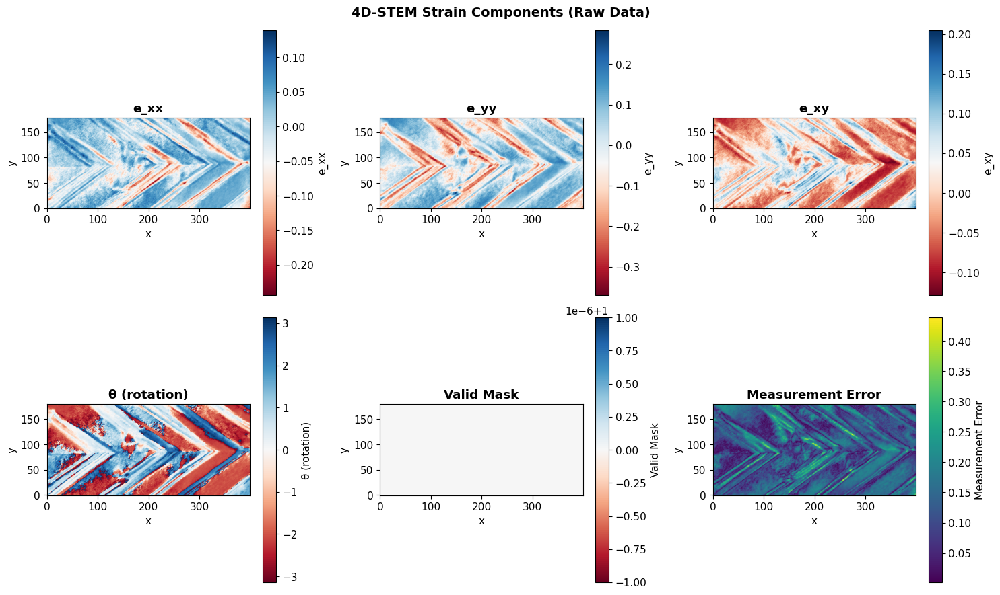

✓ Raw data visualization saved to: /Users/robertodosreis/Documents/codes/PINNs-4DSTEM-dev/outputs/sota_adaptive/00_raw_data_overview.png


In [8]:
# Visualize raw strain data
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
fig.suptitle('4D-STEM Strain Components (Raw Data)', fontsize=14, fontweight='bold')

components = [
    (e_xx, 'e_xx', 0),
    (e_yy, 'e_yy', 1),
    (e_xy, 'e_xy', 2),
    (theta, 'θ (rotation)', 3),
    (mask, 'Valid Mask', 4),
    (error, 'Measurement Error', 5),
]

for arr, label, idx in components:
    ax = axes.flat[idx]
    
    # Replace NaN/Inf with valid values for visualization
    arr_display = np.copy(arr).astype(float)
    arr_display[~np.isfinite(arr_display)] = 0.0
    
    # Compute vmin/vmax from valid data only
    # Use only finite values to avoid NaN/Inf issues
    finite_mask = np.isfinite(arr_display)
    if np.any(finite_mask):
        valid_data = arr_display[finite_mask]
        vmin = float(np.min(valid_data))
        vmax = float(np.max(valid_data))
        # If all values are the same, add small epsilon for contrast
        if vmin == vmax:
            vmin -= 1e-6
            vmax += 1e-6
    else:
        vmin, vmax = 0.0, 1.0
    
    # Final safety check - ensure vmin and vmax are strictly finite
    if not (np.isfinite(vmin) and np.isfinite(vmax)):
        vmin, vmax = 0.0, 1.0
    
    # Ensure vmin <= vmax
    if vmin > vmax:
        vmin, vmax = vmax, vmin
    
    if idx < 5:
        im = ax.imshow(arr_display, cmap='RdBu', origin='lower', vmin=vmin, vmax=vmax)
    else:
        im = ax.imshow(arr_display, cmap='viridis', origin='lower', vmin=vmin, vmax=vmax)
    
    try:
        cbar = plt.colorbar(im, ax=ax, label=label)
    except ValueError as e:
        print(f"⚠️  Colorbar failed for {label}: {e}")
        print(f"   vmin={vmin}, vmax={vmax}, isfinite={np.isfinite(vmin) and np.isfinite(vmax)}")
    
    ax.set_title(label, fontweight='bold')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    
    # Print stats
    finite_mask = np.isfinite(arr)
    if np.any(finite_mask):
        valid_data = arr[finite_mask]
        print(f"{label:15s}: min={np.min(valid_data):+.4e}, max={np.max(valid_data):+.4e}, " + 
              f"mean={np.mean(valid_data):+.4e}, std={np.std(valid_data):.4e}")
    else:
        print(f"{label:15s}: [No finite data]")

plt.tight_layout()
plt.savefig(out_dir / "00_raw_data_overview.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Raw data visualization saved to: {out_dir / '00_raw_data_overview.png'}")

In [4]:
# Diagnostic check for NaN/Inf values
print("\n=== DATA QUALITY CHECK ===")
for name, arr in [('e_xx', e_xx), ('e_yy', e_yy), ('e_xy', e_xy), ('theta', theta), ('mask', mask), ('error', error)]:
    n_nan = np.isnan(arr).sum()
    n_inf = np.isinf(arr).sum()
    n_finite = np.isfinite(arr).sum()
    print(f"{name:10s}: NaN={n_nan:6d}, Inf={n_inf:6d}, Finite={n_finite:6d} / {arr.size:6d}")

print("="*40)


=== DATA QUALITY CHECK ===
e_xx      : NaN=     0, Inf=     0, Finite= 72000 /  72000
e_yy      : NaN=     0, Inf=     0, Finite= 72000 /  72000
e_xy      : NaN=     0, Inf=     0, Finite= 72000 /  72000
theta     : NaN=     0, Inf=     0, Finite= 72000 /  72000
mask      : NaN=     0, Inf=     0, Finite= 72000 /  72000
error     : NaN=     0, Inf=     0, Finite= 72000 /  72000


In [5]:
# ============================================================================
# SECTION 3: State-of-the-Art PINN Architecture (SIREN + Skip Connections)
# ============================================================================

class SirenLayer(nn.Module):
    """SIREN layer with sine activation and proper weight initialization."""
    def __init__(self, in_features, out_features, is_first=False, omega_0=1.0):
        super().__init__()
        self.in_features = in_features
        self.is_first = is_first
        self.omega_0 = omega_0
        
        self.linear = nn.Linear(in_features, out_features)
        
        # Proper initialization (Sitzmann et al., 2020)
        with torch.no_grad():
            if is_first:
                self.linear.weight.uniform_(-1 / in_features, 1 / in_features)
            else:
                bound = np.sqrt(6 / in_features) / omega_0
                self.linear.weight.uniform_(-bound, bound)
    
    def forward(self, x):
        return torch.sin(self.omega_0 * self.linear(x))


class StrainPINN_SIREN(nn.Module):
    """State-of-the-art SIREN architecture with skip connections for strain maps."""
    def __init__(self, hidden_dim=128, num_layers=6, omega_0=1.0, skip_connections=True):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.skip_connections = skip_connections
        
        # First layer: (x,y) -> hidden
        self.first = SirenLayer(2, hidden_dim, is_first=True, omega_0=omega_0)
        
        # Hidden layers with optional skip connections
        self.hidden_layers = nn.ModuleList([
            SirenLayer(hidden_dim, hidden_dim, is_first=False, omega_0=omega_0)
            for _ in range(num_layers - 2)
        ])
        
        # Skip connection projection (if used)
        if self.skip_connections:
            self.skip_proj = nn.Linear(hidden_dim, hidden_dim)
        
        # Final output layer
        self.final = nn.Linear(hidden_dim, 4)  # e_xx, e_yy, e_xy, theta
        
        # Initialize final layer to near-zero
        with torch.no_grad():
            self.final.weight.uniform_(-np.sqrt(6 / hidden_dim), np.sqrt(6 / hidden_dim))
    
    def forward(self, x):
        """x shape: (N, 2)"""
        # First layer
        x_h = self.first(x)  # (N, hidden_dim)
        
        # Hidden layers with skip connections
        for i, layer in enumerate(self.hidden_layers):
            if self.skip_connections and i % 2 == 0 and i > 0:
                # Skip connection every 2 layers
                x_h_new = layer(x_h) + self.skip_proj(x_h)
            else:
                x_h_new = layer(x_h)
            x_h = x_h_new
        
        # Final output
        out = self.final(x_h)  # (N, 4)
        return out


class StrainPINN_Fourier(nn.Module):
    """Fourier feature network: encodes spatial input with Fourier features."""
    def __init__(self, hidden_dim=128, num_layers=6, B_scale=1.0):
        super().__init__()
        self.B_scale = B_scale
        # Fixed Fourier feature matrix
        self.register_buffer('B', torch.randn(2, hidden_dim // 2) * B_scale)
        
        self.net = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            *[nn.Sequential(nn.Linear(hidden_dim, hidden_dim), nn.ReLU()) 
              for _ in range(num_layers - 2)],
            nn.Linear(hidden_dim, 4),
        )
    
    def forward(self, x):
        """x shape: (N, 2)"""
        # Compute Fourier features: [sin(2π*B*x), cos(2π*B*x)]
        proj = torch.matmul(x, self.B)  # (N, hidden_dim//2)
        x_enc = torch.cat([torch.sin(2 * np.pi * proj), torch.cos(2 * np.pi * proj)], dim=1)  # (N, hidden_dim)
        return self.net(x_enc)


class StrainPINN_Standard(nn.Module):
    """Standard MLP baseline."""
    def __init__(self, hidden_dim=128, num_layers=6):
        super().__init__()
        layers = [nn.Linear(2, hidden_dim), nn.ReLU()]
        for _ in range(num_layers - 2):
            layers.append(nn.Linear(hidden_dim, hidden_dim))
            layers.append(nn.ReLU())
        layers.append(nn.Linear(hidden_dim, 4))
        self.net = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.net(x)


def create_pinn_model(arch_type, hidden_dim, num_layers, skip_connections=False):
    """Factory function to create PINN models."""
    if arch_type == "siren":
        return StrainPINN_SIREN(hidden_dim, num_layers, omega_0=1.0, skip_connections=skip_connections)
    elif arch_type == "fourier":
        return StrainPINN_Fourier(hidden_dim, num_layers, B_scale=1.0)
    elif arch_type == "standard":
        return StrainPINN_Standard(hidden_dim, num_layers)
    else:
        raise ValueError(f"Unknown architecture: {arch_type}")


# Instantiate model and show summary
model_test = create_pinn_model(config["architecture"], config["hidden_dim"], 
                               config["num_layers"], config["skip_connections"])
print(f"\n✓ Model Architecture: {config['architecture'].upper()}")
print(f"  Parameters: {sum(p.numel() for p in model_test.parameters()):,}")
print(model_test)


✓ Model Architecture: SIREN
  Parameters: 83,460
StrainPINN_SIREN(
  (first): SirenLayer(
    (linear): Linear(in_features=2, out_features=128, bias=True)
  )
  (hidden_layers): ModuleList(
    (0-3): 4 x SirenLayer(
      (linear): Linear(in_features=128, out_features=128, bias=True)
    )
  )
  (skip_proj): Linear(in_features=128, out_features=128, bias=True)
  (final): Linear(in_features=128, out_features=4, bias=True)
)



SAMPLING STRATEGY: SPARSE TRAINING MASKS
      1%:    720 / 72,000 points → spatial coverage: 1.0%
      5%:  3,600 / 72,000 points → spatial coverage: 5.0%
     10%:  7,200 / 72,000 points → spatial coverage: 10.0%
     25%: 18,000 / 72,000 points → spatial coverage: 25.0%
     50%: 36,000 / 72,000 points → spatial coverage: 50.0%
     75%: 54,000 / 72,000 points → spatial coverage: 75.0%


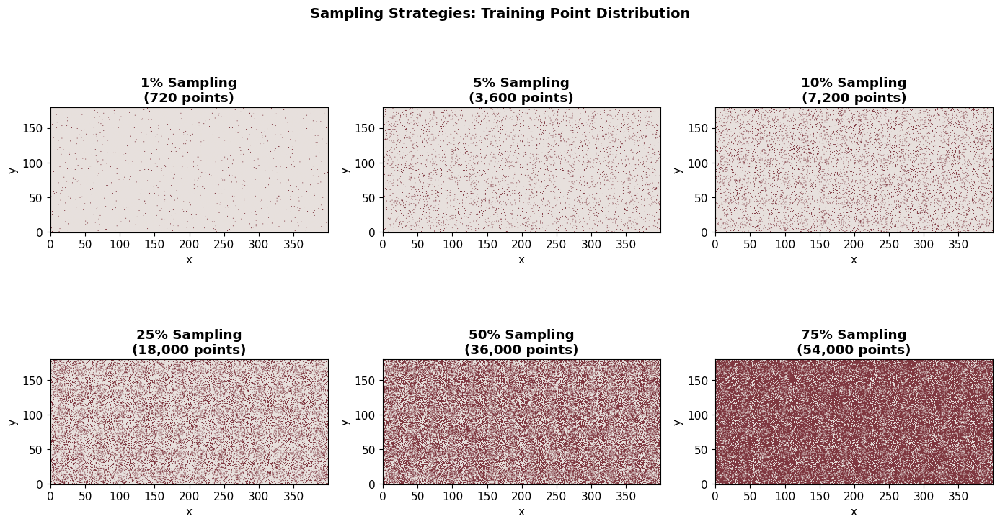

✓ Sampling visualization saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/01_sampling_patterns.png


In [6]:
# ============================================================================
# SECTION 4: Sampling Strategies & Sparse Masks
# ============================================================================

def create_sparse_mask(mask_full, sampling_fraction, seed=SEED):
    """
    Create sparse training mask by randomly selecting sampling_fraction of valid points.
    
    Args:
        mask_full: Full binary mask (H, W)
        sampling_fraction: Fraction of valid points to use [0, 1]
        seed: Random seed for reproducibility
        
    Returns:
        sparse_mask: Binary mask (H, W) with same shape as input
        selected_indices: 1D array of flat indices where mask_sparse == 1
    """
    rng = np.random.RandomState(seed)
    
    # Get indices of all valid points
    valid_indices = np.where(mask_full.flatten())[0]
    n_valid = len(valid_indices)
    
    # Sample points
    n_samples = max(1, int(np.ceil(sampling_fraction * n_valid)))
    selected_flat_indices = rng.choice(valid_indices, n_samples, replace=False)
    
    # Create sparse mask
    sparse_mask_flat = np.zeros(mask_full.size, dtype=np.float32)
    sparse_mask_flat[selected_flat_indices] = 1.0
    sparse_mask = sparse_mask_flat.reshape(mask_full.shape)
    
    return sparse_mask, selected_flat_indices


# Create sparse masks for all sampling fractions
sparse_masks = {}
sampled_indices = {}

print("\n" + "="*70)
print("SAMPLING STRATEGY: SPARSE TRAINING MASKS")
print("="*70)
for frac in config["sampling_fractions"]:
    sparse_mask, indices = create_sparse_mask(mask, frac, seed=SEED + int(frac * 1000))
    sparse_masks[frac] = torch.tensor(sparse_mask.flatten(), dtype=torch.float32, device=device)
    sampled_indices[frac] = indices
    
    n_train = sparse_mask.sum()
    n_valid = mask.sum()
    print(f"  {frac*100:5.0f}%: {int(n_train):6,d} / {int(n_valid):6,d} points → spatial coverage: {100*n_train/mask.size:.1f}%")

# Visualize sampling patterns
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
fig.suptitle('Sampling Strategies: Training Point Distribution', fontsize=14, fontweight='bold')

for idx, frac in enumerate(config["sampling_fractions"]):
    ax = axes.flat[idx]
    
    # Show the full mask in light gray
    ax.imshow(mask, cmap='gray', alpha=0.3, origin='lower')
    
    # Overlay sparse mask
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    ax.imshow(sparse_mask_np, cmap='Reds', alpha=0.7, origin='lower')
    
    n_train = sparse_mask_np.sum()
    ax.set_title(f'{frac*100:.0f}% Sampling\n({int(n_train):,} points)', fontweight='bold')
    ax.set_xlabel('x')
    ax.set_ylabel('y')

plt.tight_layout()
plt.savefig(out_dir / "01_sampling_patterns.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Sampling visualization saved to: {out_dir / '01_sampling_patterns.png'}")

In [7]:
# ============================================================================
# SECTION 5: Physics-Informed Loss & Training Functions
# ============================================================================

def compute_stress_from_strain(e_xx, e_yy, e_xy, E, nu):
    """
    Compute stresses from strains using linear elasticity (plane stress).
    
    σ_xx = E/(1-ν²) * (ε_xx + ν*ε_yy)
    σ_yy = E/(1-ν²) * (ε_yy + ν*ε_xx)
    σ_xy = E/(2(1+ν)) * ε_xy = G * ε_xy
    """
    factor = E / (1 - nu ** 2)
    sigma_xx = factor * (e_xx + nu * e_yy)
    sigma_yy = factor * (e_yy + nu * e_xx)
    
    G = E / (2 * (1 + nu))
    sigma_xy = G * e_xy
    
    return sigma_xx, sigma_yy, sigma_xy


def compute_equilibrium_residual(e_xx, e_yy, e_xy, H, W, dx, dy, E, nu):
    """
    Compute equilibrium residuals: ∂σ_xx/∂x + ∂σ_xy/∂y and ∂σ_xy/∂x + ∂σ_yy/∂y.
    Returns L2 norm of residuals.
    """
    # Reshape to grids
    e_xx_grid = e_xx.reshape(H, W)
    e_yy_grid = e_yy.reshape(H, W)
    e_xy_grid = e_xy.reshape(H, W)
    
    # Compute stresses
    sigma_xx, sigma_yy, sigma_xy = compute_stress_from_strain(e_xx_grid, e_yy_grid, e_xy_grid, E, nu)
    
    # Compute spatial derivatives using finite differences (central differences)
    # ∂σ_xx/∂x
    dsxx_dx = torch.zeros_like(sigma_xx)
    dsxx_dx[:, 1:-1] = (sigma_xx[:, 2:] - sigma_xx[:, :-2]) / (2 * dx)
    dsxx_dx[:, 0] = (sigma_xx[:, 1] - sigma_xx[:, 0]) / dx
    dsxx_dx[:, -1] = (sigma_xx[:, -1] - sigma_xx[:, -2]) / dx
    
    # ∂σ_xy/∂y
    dsxy_dy = torch.zeros_like(sigma_xy)
    dsxy_dy[1:-1, :] = (sigma_xy[2:, :] - sigma_xy[:-2, :]) / (2 * dy)
    dsxy_dy[0, :] = (sigma_xy[1, :] - sigma_xy[0, :]) / dy
    dsxy_dy[-1, :] = (sigma_xy[-1, :] - sigma_xy[-2, :]) / dy
    
    # ∂σ_xy/∂x
    dsxy_dx = torch.zeros_like(sigma_xy)
    dsxy_dx[:, 1:-1] = (sigma_xy[:, 2:] - sigma_xy[:, :-2]) / (2 * dx)
    dsxy_dx[:, 0] = (sigma_xy[:, 1] - sigma_xy[:, 0]) / dx
    dsxy_dx[:, -1] = (sigma_xy[:, -1] - sigma_xy[:, -2]) / dx
    
    # ∂σ_yy/∂y
    dsyy_dy = torch.zeros_like(sigma_yy)
    dsyy_dy[1:-1, :] = (sigma_yy[2:, :] - sigma_yy[:-2, :]) / (2 * dy)
    dsyy_dy[0, :] = (sigma_yy[1, :] - sigma_yy[0, :]) / dy
    dsyy_dy[-1, :] = (sigma_yy[-1, :] - sigma_yy[-2, :]) / dy
    
    # Equilibrium equations
    eq_x = dsxx_dx + dsxy_dy
    eq_y = dsxy_dx + dsyy_dy
    
    # L2 norm
    residual = torch.sqrt(eq_x ** 2 + eq_y ** 2 + 1e-8)
    
    return residual, sigma_xx, sigma_yy, sigma_xy


class AdaptiveLossBalancer:
    """GradNorm-based adaptive loss balancing."""
    def __init__(self, num_tasks=2, alpha=1.5):
        self.num_tasks = num_tasks
        self.alpha = alpha
        self.task_weights = torch.ones(num_tasks)
        self.initial_losses = None
    
    def update(self, task_losses, model):
        """Update weights based on gradient norms of each task."""
        if self.initial_losses is None:
            self.initial_losses = torch.tensor([l.item() for l in task_losses])
        
        # Compute gradient norms
        grad_norms = []
        for loss in task_losses:
            grads = torch.autograd.grad(loss, model.parameters(), retain_graph=True, 
                                       create_graph=False, allow_unused=True)
            grad_norm = torch.stack([g.norm() for g in grads if g is not None]).mean()
            grad_norms.append(grad_norm)
        
        grad_norms = torch.stack(grad_norms)
        
        # Target: all tasks should have similar gradient magnitude
        avg_grad_norm = grad_norms.mean()
        target_grad_norm = avg_grad_norm ** self.alpha
        
        # Update weights inversely proportional to gradient norm
        with torch.no_grad():
            self.task_weights = target_grad_norm / grad_norms
            self.task_weights = self.task_weights / self.task_weights.sum() * self.num_tasks
        
        return self.task_weights


def pinn_loss_with_physics(model, x, y, e_xx_true, e_yy_true, e_xy_true, theta_true,
                           sparse_mask, H, W, device, cfg):
    """
    Compute combined data + physics loss with adaptive balancing.
    """
    # Forward pass
    inputs = torch.stack([x, y], dim=1)
    outputs = model(inputs)  # (N, 4) -> e_xx, e_yy, e_xy, theta
    e_xx_pred, e_yy_pred, e_xy_pred, theta_pred = outputs[:, 0], outputs[:, 1], outputs[:, 2], outputs[:, 3]
    
    # DATA LOSS: MSE on sparse points only
    sq_data = (
        (e_xx_pred - e_xx_true) ** 2 +
        (e_yy_pred - e_yy_true) ** 2 +
        (e_xy_pred - e_xy_true) ** 2 +
        (theta_pred - theta_true) ** 2
    )
    loss_data = (sparse_mask * sq_data).sum() / (sparse_mask.sum() + 1e-8)
    
    # PHYSICS LOSS: Equilibrium residuals
    # De-scale predictions to physical units
    e_xx_phys = e_xx_pred * scalers['e_xx']['std'] + scalers['e_xx']['mean']
    e_yy_phys = e_yy_pred * scalers['e_yy']['std'] + scalers['e_yy']['mean']
    e_xy_phys = e_xy_pred * scalers['e_xy']['std'] + scalers['e_xy']['mean']
    
    dx = 1.0 / max(1, W - 1)
    dy = 1.0 / max(1, H - 1)
    
    residual_grid, _, _, _ = compute_equilibrium_residual(
        e_xx_phys, e_yy_phys, e_xy_phys, H, W, dx, dy, cfg['E'], cfg['nu']
    )
    
    # Normalize by E if requested
    if cfg.get('normalize_physics_by_E', False):
        residual_grid = residual_grid / cfg['E']
    
    loss_physics = residual_grid.mean()
    
    # Total loss with adaptive weighting
    w_data = cfg.get('w_data', cfg.get('w_data_init', 1.0))
    w_physics = cfg.get('w_physics', cfg.get('w_physics_init', 0.01))
    total_loss = w_data * loss_data + w_physics * loss_physics
    
    return total_loss, loss_data.detach(), loss_physics.detach()


print("✓ Physics-informed loss functions defined")

✓ Physics-informed loss functions defined


In [8]:
# ============================================================================
# SECTION 6: Residual-Based Adaptive Refinement (RAR)
# ============================================================================

def adaptive_refinement_rar(model, x, y, e_xx_phys_preds, e_yy_phys_preds, e_xy_phys_preds,
                            current_sparse_mask, H, W, cfg, n_new_points_pct=0.10):
    """
    Residual-Based Adaptive Refinement: add high-residual points to training set.
    
    Args:
        model: Trained PINN model
        x, y: Full domain coordinates
        current_sparse_mask: Current sparse training mask
        H, W: Grid dimensions
        cfg: Configuration dict
        n_new_points_pct: Fraction of current training set size to add
        
    Returns:
        refined_sparse_mask: Updated sparse mask with new points
        residual_grid: Residual field across domain
    """
    # Evaluate model on full domain
    with torch.no_grad():
        inputs = torch.stack([x, y], dim=1)
        outputs = model(inputs)
        e_xx_pred = outputs[:, 0] * scalers['e_xx']['std'] + scalers['e_xx']['mean']
        e_yy_pred = outputs[:, 1] * scalers['e_yy']['std'] + scalers['e_yy']['mean']
        e_xy_pred = outputs[:, 2] * scalers['e_xy']['std'] + scalers['e_xy']['mean']
        
        # Compute residuals
        dx = 1.0 / max(1, W - 1)
        dy = 1.0 / max(1, H - 1)
        residual_grid, _, _, _ = compute_equilibrium_residual(
            e_xx_pred, e_yy_pred, e_xy_pred, H, W, dx, dy, cfg['E'], cfg['nu']
        )
        
        if cfg.get('normalize_physics_by_E', False):
            residual_grid = residual_grid / cfg['E']
    
    # Identify high-residual points
    residual_flat = residual_grid.flatten()
    percentile_threshold = cfg.get('rar_residual_percentile', 90)
    residual_threshold = torch.quantile(residual_flat, percentile_threshold / 100.0)
    
    # Find points above threshold that are NOT already in training set
    current_mask_flat = current_sparse_mask.cpu().numpy() > 0.5
    high_residual_mask = (residual_flat > residual_threshold).cpu().numpy()
    new_candidate_indices = np.where(high_residual_mask & ~current_mask_flat)[0]
    
    # Sample n_new_points from candidates
    current_n_train = int(current_sparse_mask.sum().item())
    n_new_points = max(1, int(np.ceil(n_new_points_pct * current_n_train)))
    
    if len(new_candidate_indices) > 0:
        rng = np.random.RandomState(SEED)
        n_select = min(len(new_candidate_indices), n_new_points)
        new_indices = rng.choice(new_candidate_indices, n_select, replace=False)
        
        # Create refined mask
        refined_mask_flat = current_mask_flat.astype(np.float32)
        refined_mask_flat[new_indices] = 1.0
        refined_sparse_mask = torch.tensor(refined_mask_flat, dtype=torch.float32, device=device)
        
        print(f"    RAR: Added {len(new_indices)} new points (from {len(new_candidate_indices)} candidates). " +
              f"Total now: {int(refined_sparse_mask.sum().item()):,}")
    else:
        print(f"    RAR: No candidate points found above percentile {percentile_threshold}")
        refined_sparse_mask = current_sparse_mask.clone()
    
    return refined_sparse_mask, residual_grid


print("✓ Residual-based adaptive refinement (RAR) function defined")

✓ Residual-based adaptive refinement (RAR) function defined


In [9]:
# ============================================================================
# SECTION 7: Main Training Loop (All Sampling Fractions)
# ============================================================================

def train_pinn_sparse(sampling_fraction, sparse_mask, cfg, device):
    """
    Train a single PINN model on sparse data with physics constraints and RAR.
    
    Args:
        sampling_fraction: Fraction of points used for training
        sparse_mask: Binary sparse training mask (already on device)
        cfg: Configuration dictionary
        device: Device (cpu/cuda/mps)
        
    Returns:
        model: Trained PINN model
        history: Training history dictionary
        residual_history: Residual field history
    """
    # Initialize model
    model = create_pinn_model(cfg['architecture'], cfg['hidden_dim'], 
                             cfg['num_layers'], cfg['skip_connections']).to(device)
    
    # Optimizer with learning rate schedule
    optimizer = torch.optim.Adam(model.parameters(), lr=cfg['lr'], weight_decay=1e-6)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=cfg['lr_decay_interval'],
                                               gamma=cfg['lr_decay_factor'])
    
    # Training history
    history = {
        'epoch': [],
        'loss_total': [],
        'loss_data': [],
        'loss_physics': [],
        'lr': [],
    }
    
    residual_history = {}
    
    best_loss = float('inf')
    patience_counter = 0
    
    # Training loop
    current_sparse_mask = sparse_mask.clone()
    
    for epoch in trange(cfg['epochs'], desc=f"Train {sampling_fraction*100:.0f}%", leave=False):
        # Adaptive refinement every 500 epochs
        if cfg['enable_rar'] and epoch > cfg['rar_trigger_epoch'] and epoch % 500 == 0:
            current_sparse_mask, res_grid = adaptive_refinement_rar(
                model, x_flat, y_flat, None, None, None,
                current_sparse_mask, H, W, cfg, n_new_points_pct=cfg['rar_num_new_points_pct']
            )
            if epoch % 1000 == 0:
                residual_history[epoch] = res_grid.detach().cpu().numpy()
        
        # Forward + loss computation
        optimizer.zero_grad()
        total_loss, loss_data, loss_physics = pinn_loss_with_physics(
            model, x_flat, y_flat,
            e_xx_scaled, e_yy_scaled, e_xy_scaled, theta_scaled,
            current_sparse_mask, H, W, device, cfg
        )
        
        # Backward
        total_loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        scheduler.step()
        
        # Logging
        history['epoch'].append(epoch)
        history['loss_total'].append(total_loss.item())
        history['loss_data'].append(loss_data.item())
        history['loss_physics'].append(loss_physics.item())
        history['lr'].append(scheduler.get_last_lr()[0])
        
        # Early stopping
        improved = (best_loss - total_loss.item()) > cfg['min_delta']
        if improved:
            best_loss = total_loss.item()
            patience_counter = 0
        else:
            patience_counter += 1
        
        if cfg['early_stop'] and patience_counter >= cfg['patience']:
            if cfg['verbose']:
                print(f"      → Early stopping @ epoch {epoch} (best loss: {best_loss:.4e})")
            break
    
    return model, history, residual_history


# Train models for all sampling fractions
print("\n" + "="*70)
print("TRAINING: State-of-the-Art PINNS Across Sampling Fractions")
print("="*70)

trained_models = {}
training_histories = {}
training_times = {}

start_time_total = time.time()

for frac in config["sampling_fractions"]:
    print(f"\n▶ TRAINING on {frac*100:.0f}% data...")
    
    start_time = time.time()
    model, history, residual_hist = train_pinn_sparse(frac, sparse_masks[frac], config, device)
    elapsed = time.time() - start_time
    
    trained_models[frac] = model
    training_histories[frac] = history
    training_times[frac] = elapsed
    
    print(f"  ✓ Completed in {elapsed:.1f}s | Final loss: {history['loss_total'][-1]:.4e}")
    print(f"  ✓ Epochs: {len(history['epoch'])} | Convergence: {history['loss_total'][-1]/history['loss_total'][0]:.2e}x")

total_time = time.time() - start_time_total
print(f"\n✓ All training completed in {total_time:.1f}s")

# Create summary table
summary_df = pd.DataFrame({
    'Sampling %': [f'{f*100:.0f}%' for f in config["sampling_fractions"]],
    'Training Points': [int((sparse_masks[f].sum()).item()) for f in config["sampling_fractions"]],
    'Final Loss': [training_histories[f]['loss_total'][-1] for f in config["sampling_fractions"]],
    'Epochs': [len(training_histories[f]['epoch']) for f in config["sampling_fractions"]],
    'Time (s)': [training_times[f] for f in config["sampling_fractions"]],
})

print("\nTraining Summary:")
print(summary_df.to_string(index=False))


TRAINING: State-of-the-Art PINNS Across Sampling Fractions

▶ TRAINING on 1% data...


Train 1%:  50%|█████     | 2512/5000 [00:34<01:25, 29.00it/s]

    RAR: Added 72 new points (from 7119 candidates). Total now: 792


      → Early stopping @ epoch 2898 (best loss: 2.6774e-01)
  ✓ Completed in 40.6s | Final loss: 3.3388e-01
  ✓ Epochs: 2899 | Convergence: 4.22e-02x

▶ TRAINING on 5% data...


Train 5%:  50%|█████     | 2512/5000 [00:33<00:33, 75.17it/s]

    RAR: Added 360 new points (from 6859 candidates). Total now: 3,960


      → Early stopping @ epoch 2899 (best loss: 8.0979e-01)
  ✓ Completed in 38.3s | Final loss: 8.2800e-01
  ✓ Epochs: 2900 | Convergence: 1.49e-01x

▶ TRAINING on 10% data...


Train 10%:  50%|█████     | 2512/5000 [00:33<00:33, 75.07it/s]

    RAR: Added 720 new points (from 6480 candidates). Total now: 7,920


      → Early stopping @ epoch 2899 (best loss: 9.3430e-01)
  ✓ Completed in 38.3s | Final loss: 1.0467e+00
  ✓ Epochs: 2900 | Convergence: 1.34e-01x

▶ TRAINING on 25% data...


Train 25%:  50%|█████     | 2512/5000 [00:33<00:33, 74.90it/s]

    RAR: Added 1800 new points (from 5446 candidates). Total now: 19,800


Train 25%:  60%|██████    | 3008/5000 [00:39<00:26, 74.88it/s]

    RAR: Added 1980 new points (from 3837 candidates). Total now: 21,780


Train 25%:  70%|███████   | 3512/5000 [00:46<00:19, 75.45it/s]

    RAR: Added 2178 new points (from 2362 candidates). Total now: 23,958


Train 25%:  80%|████████  | 4008/5000 [00:52<00:13, 75.09it/s]

    RAR: Added 1304 new points (from 1304 candidates). Total now: 25,262


Train 25%:  90%|█████████ | 4512/5000 [00:59<00:06, 75.31it/s]

    RAR: Added 834 new points (from 834 candidates). Total now: 26,096


  ✓ Completed in 66.1s | Final loss: 8.9364e-01
  ✓ Epochs: 5000 | Convergence: 1.65e-01x

▶ TRAINING on 50% data...


Train 50%:  50%|█████     | 2512/5000 [00:33<00:33, 74.88it/s]

    RAR: Added 3540 new points (from 3540 candidates). Total now: 39,540


      → Early stopping @ epoch 2889 (best loss: 9.5363e-01)
  ✓ Completed in 38.3s | Final loss: 9.6285e-01
  ✓ Epochs: 2890 | Convergence: 1.35e-01x

▶ TRAINING on 75% data...


Train 75%:  50%|█████     | 2512/5000 [00:33<00:33, 74.73it/s]

    RAR: Added 1729 new points (from 1729 candidates). Total now: 55,729


Train 75%:  60%|██████    | 3008/5000 [00:39<00:26, 74.85it/s]

    RAR: Added 452 new points (from 452 candidates). Total now: 56,181


Train 75%:  70%|███████   | 3512/5000 [00:46<00:19, 74.61it/s]

    RAR: Added 280 new points (from 280 candidates). Total now: 56,461


Train 75%:  80%|████████  | 4008/5000 [00:52<00:13, 74.76it/s]

    RAR: Added 193 new points (from 193 candidates). Total now: 56,654


Train 75%:  90%|█████████ | 4512/5000 [00:59<00:06, 75.11it/s]

    RAR: Added 134 new points (from 134 candidates). Total now: 56,788


  ✓ Completed in 66.0s | Final loss: 7.4204e-01
  ✓ Epochs: 5000 | Convergence: 1.00e-01x

✓ All training completed in 287.5s

Training Summary:
Sampling %  Training Points  Final Loss  Epochs  Time (s)
        1%              720    0.333882    2899 40.601626
        5%             3600    0.828000    2900 38.323548
       10%             7200    1.046684    2900 38.278285
       25%            18000    0.893642    5000 66.050781
       50%            36000    0.962848    2890 38.289439
       75%            54000    0.742043    5000 65.953130


In [11]:
# ============================================================================
# SECTION 8: Evaluation & Metrics Computation
# ============================================================================

def evaluate_model(model, x, y, e_xx_true, e_yy_true, e_xy_true, theta_true,
                   mask_eval, H, W, device):
    """
    Evaluate model and compute comprehensive metrics.
    
    Returns:
        predictions: Dict of predicted strain components
        metrics: Dict of per-component metrics
    """
    with torch.no_grad():
        inputs = torch.stack([x, y], dim=1)
        outputs = model(inputs)
        e_xx_pred_s, e_yy_pred_s, e_xy_pred_s, theta_pred_s = outputs[:, 0], outputs[:, 1], outputs[:, 2], outputs[:, 3]
    
    # Unscale predictions
    e_xx_pred = unscale(e_xx_pred_s, 'e_xx')
    e_yy_pred = unscale(e_yy_pred_s, 'e_yy')
    e_xy_pred = unscale(e_xy_pred_s, 'e_xy')
    theta_pred = unscale(theta_pred_s, 'theta')
    
    # Move to CPU for numpy operations
    e_xx_pred_np = e_xx_pred.cpu().numpy().reshape(H, W)
    e_yy_pred_np = e_yy_pred.cpu().numpy().reshape(H, W)
    e_xy_pred_np = e_xy_pred.cpu().numpy().reshape(H, W)
    theta_pred_np = theta_pred.cpu().numpy().reshape(H, W)
    
    predictions = {
        'e_xx': e_xx_pred_np,
        'e_yy': e_yy_pred_np,
        'e_xy': e_xy_pred_np,
        'theta': theta_pred_np,
    }
    
    # Compute metrics per component
    metrics = {}
    for name, pred, true in [
        ('e_xx', e_xx_pred_np, e_xx),
        ('e_yy', e_yy_pred_np, e_yy),
        ('e_xy', e_xy_pred_np, e_xy),
        ('theta', theta_pred_np, theta),
    ]:
        valid_idx = mask_eval > 0.5
        pred_valid = pred[valid_idx]
        true_valid = true[valid_idx]
        
        mse = np.mean((pred_valid - true_valid) ** 2)
        rmse = np.sqrt(mse)
        mae = np.mean(np.abs(pred_valid - true_valid))
        max_err = np.max(np.abs(pred_valid - true_valid))
        
        # R² score
        ss_res = np.sum((true_valid - pred_valid) ** 2)
        ss_tot = np.sum((true_valid - np.mean(true_valid)) ** 2)
        r2 = 1 - (ss_res / ss_tot) if ss_tot > 0 else 0.0
        
        # Normalized RMSE
        range_true = np.max(true_valid) - np.min(true_valid)
        nrmse_range = rmse / range_true if range_true > 0 else 0.0
        
        std_true = np.std(true_valid)
        nrmse_std = rmse / std_true if std_true > 0 else 0.0
        
        metrics[name] = {
            'MSE': mse,
            'RMSE': rmse,
            'MAE': mae,
            'Max Error': max_err,
            'R²': r2,
            'NRMSE (range)': nrmse_range,
            'NRMSE (std)': nrmse_std,
        }
    
    return predictions, metrics


# Evaluate all models
print("\n" + "="*70)
print("EVALUATION: Computing Metrics Across All Models")
print("="*70)

all_predictions = {}
all_metrics = {}

for frac in config["sampling_fractions"]:
    print(f"  Evaluating {frac*100:.0f}%...")
    preds, metrics = evaluate_model(trained_models[frac], x_flat, y_flat,
                                   e_xx, e_yy, e_xy, theta,
                                   mask, H, W, device)
    all_predictions[frac] = preds
    all_metrics[frac] = metrics

print("✓ Evaluation complete")

# Create metrics summary table
print("\nMetrics Summary (R² Score):")
r2_summary = pd.DataFrame({
    'Sampling %': [f'{f*100:.0f}%' for f in config["sampling_fractions"]],
    'e_xx': [all_metrics[f]['e_xx']['R²'] for f in config["sampling_fractions"]],
    'e_yy': [all_metrics[f]['e_yy']['R²'] for f in config["sampling_fractions"]],
    'e_xy': [all_metrics[f]['e_xy']['R²'] for f in config["sampling_fractions"]],
    'theta': [all_metrics[f]['theta']['R²'] for f in config["sampling_fractions"]],
})
print(r2_summary.to_string(index=False))

print("\nMetrics Summary (RMSE):")
rmse_summary = pd.DataFrame({
    'Sampling %': [f'{f*100:.0f}%' for f in config["sampling_fractions"]],
    'e_xx': [all_metrics[f]['e_xx']['RMSE'] for f in config["sampling_fractions"]],
    'e_yy': [all_metrics[f]['e_yy']['RMSE'] for f in config["sampling_fractions"]],
    'e_xy': [all_metrics[f]['e_xy']['RMSE'] for f in config["sampling_fractions"]],
    'theta': [all_metrics[f]['theta']['RMSE'] for f in config["sampling_fractions"]],
})
print(rmse_summary.to_string(index=False))


EVALUATION: Computing Metrics Across All Models
  Evaluating 1%...
  Evaluating 5%...
  Evaluating 10%...
  Evaluating 25%...
  Evaluating 50%...
  Evaluating 75%...
✓ Evaluation complete

Metrics Summary (R² Score):
Sampling %     e_xx     e_yy     e_xy    theta
        1% 0.355156 0.561903 0.449288 0.145438
        5% 0.739717 0.799314 0.781651 0.602343
       10% 0.748011 0.797816 0.774198 0.604211
       25% 0.806789 0.843492 0.844606 0.661479
       50% 0.783166 0.815939 0.811534 0.649907
       75% 0.846250 0.884990 0.883876 0.695466

Metrics Summary (RMSE):
Sampling %     e_xx     e_yy     e_xy    theta
        1% 0.042132 0.070258 0.040888 1.653151
        5% 0.026767 0.047552 0.025746 1.127703
       10% 0.026337 0.047729 0.026181 1.125051
       25% 0.023062 0.041993 0.021719 1.040480
       50% 0.024431 0.045540 0.023919 1.058114
       75% 0.020573 0.035998 0.018775 0.986868


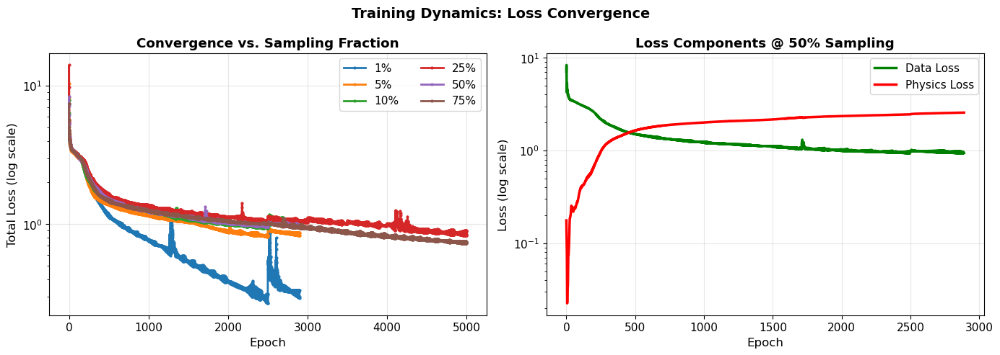

✓ Loss curves saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/02_loss_convergence.png


In [12]:
# ============================================================================
# SECTION 9: Visualization & Comparison
# ============================================================================

# 1. Loss curves for each sampling fraction
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Training Dynamics: Loss Convergence', fontsize=14, fontweight='bold')

ax = axes[0]
for frac in config["sampling_fractions"]:
    history = training_histories[frac]
    ax.semilogy(history['epoch'], history['loss_total'], marker='o', markersize=2, 
               label=f'{frac*100:.0f}%', linewidth=2)
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Total Loss (log scale)', fontsize=12)
ax.set_title('Convergence vs. Sampling Fraction', fontweight='bold')
ax.legend(loc='best', ncol=2)
ax.grid(True, alpha=0.3)

# Data vs. Physics loss breakdown for one model (50%)
ax = axes[1]
frac = 0.50
history = training_histories[frac]
ax.semilogy(history['epoch'], history['loss_data'], label='Data Loss', linewidth=2.5, color='green')
ax.semilogy(history['epoch'], history['loss_physics'], label='Physics Loss', linewidth=2.5, color='red')
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Loss (log scale)', fontsize=12)
ax.set_title(f'Loss Components @ 50% Sampling', fontweight='bold')
ax.legend(loc='best')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(out_dir / "02_loss_convergence.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Loss curves saved to: {out_dir / '02_loss_convergence.png'}")

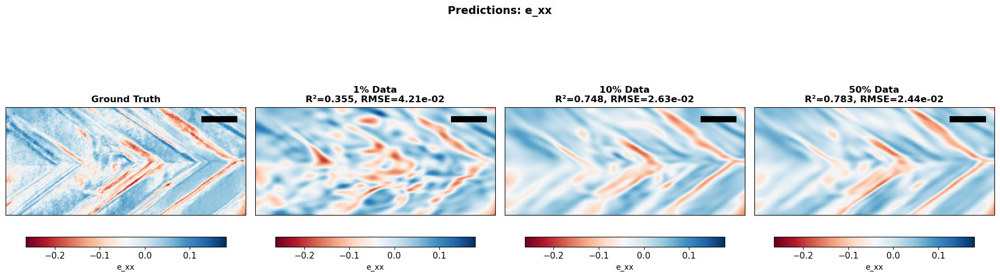

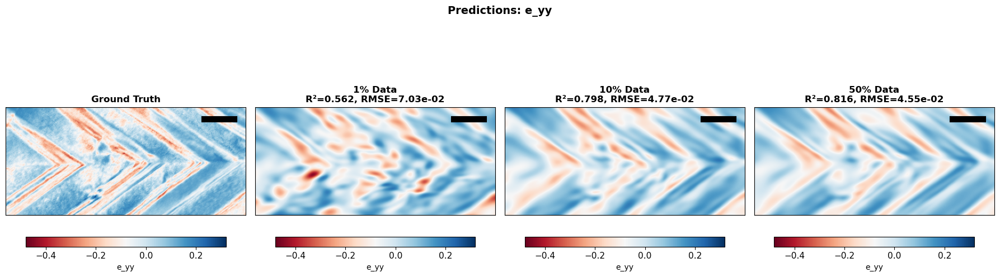

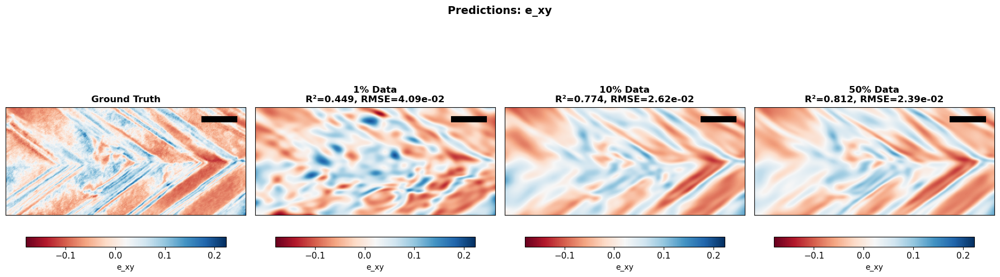

✓ Prediction maps with consistent colorbars and scale bars (nm) saved
  Calibration: 17.87 nm/pixel


In [13]:
# 2. Side-by-side predictions for selected fractions with consistent colorbars
selected_fracs = [0.01, 0.10, 0.50]

# Pixel-to-nm calibration from metadata
# Real space pixel size: 0.017872741 µm = 17.872741 nm/pixel
calibration_nm_per_pixel = 0.017872741 * 1000  # Convert µm to nm

for component, true_data in [('e_xx', e_xx), ('e_yy', e_yy), ('e_xy', e_xy)]:
    fig, axes = plt.subplots(1, len(selected_fracs) + 1, figsize=(18, 5))
    fig.suptitle(f'Predictions: {component}', fontsize=14, fontweight='bold')
    
    # Compute consistent vmin/vmax across ALL data (ground truth + all predictions)
    all_data = [true_data] + [all_predictions[frac][component] for frac in selected_fracs]
    valid_mask = np.isfinite(true_data)
    vmin = np.nanmin([np.nanmin(arr[valid_mask]) for arr in all_data])
    vmax = np.nanmax([np.nanmax(arr[valid_mask]) for arr in all_data])
    
    # Add 5% padding to the range for better contrast
    range_val = vmax - vmin
    vmin -= 0.05 * range_val
    vmax += 0.05 * range_val
    
    # Ground truth
    ax = axes[0]
    im = ax.imshow(true_data, cmap='RdBu', origin='lower', vmin=vmin, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax, location='bottom', pad=0.1, fraction=0.046)
    cbar.set_label(component, fontsize=10)
    ax.set_title('Ground Truth', fontweight='bold', fontsize=12)
    # ax.set_xlabel('x (nm)', fontsize=9)
    # ax.set_ylabel('y (nm)', fontsize=9)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Add scale bar to ground truth (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    scale_length_nm = scale_length_px * calibration_nm_per_pixel
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)
    
    # Predictions at each sampling fraction
    for idx, frac in enumerate(selected_fracs):
        ax = axes[idx + 1]
        pred = all_predictions[frac][component]
        im = ax.imshow(pred, cmap='RdBu', origin='lower', vmin=vmin, vmax=vmax)
        cbar = plt.colorbar(im, ax=ax, location='bottom', pad=0.1, fraction=0.046)
        cbar.set_label(component, fontsize=10)
        
        r2 = all_metrics[frac][component]['R²']
        rmse = all_metrics[frac][component]['RMSE']
        ax.set_title(f'{frac*100:.0f}% Data\nR²={r2:.3f}, RMSE={rmse:.2e}', 
                     fontweight='bold', fontsize=12)
        # ax.set_xlabel('x (nm)', fontsize=9)
        # ax.set_ylabel('y (nm)', fontsize=9)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Add scale bar (in nm, no label)
        ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)
    
    plt.tight_layout()
    plt.savefig(out_dir / f"03_predictions_{component}.png", dpi=150, bbox_inches='tight')
    plt.show()

print(f"✓ Prediction maps with consistent colorbars and scale bars (nm) saved")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")

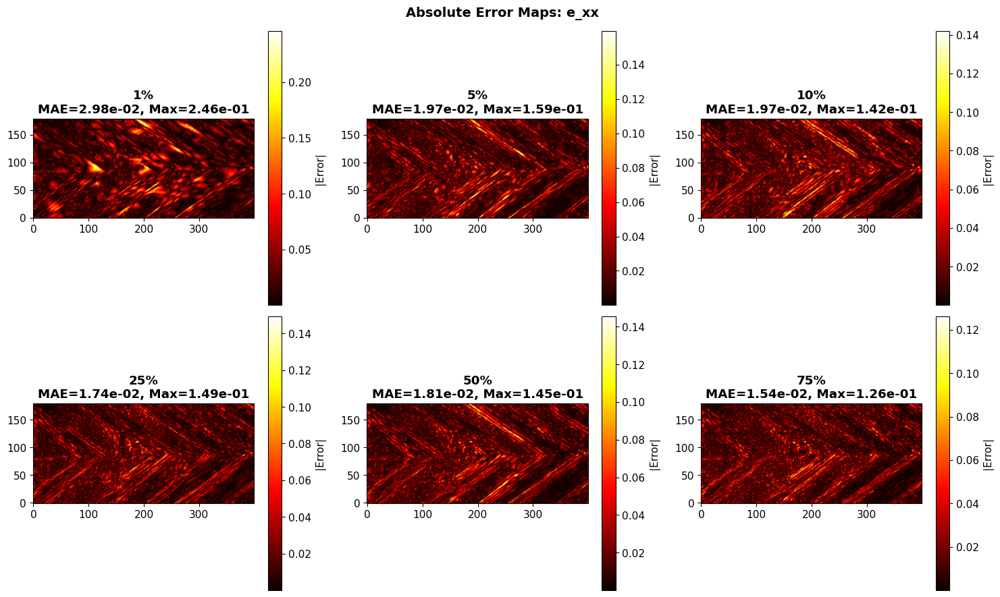

✓ Error heatmaps saved


In [14]:
# 3. Error heatmaps
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
fig.suptitle('Absolute Error Maps: e_xx', fontsize=14, fontweight='bold')

for idx, frac in enumerate(config["sampling_fractions"]):
    ax = axes.flat[idx]
    error_map = np.abs(all_predictions[frac]['e_xx'] - e_xx)
    im = ax.imshow(error_map, cmap='hot', origin='lower')
    plt.colorbar(im, ax=ax, label='|Error|')
    
    mae = all_metrics[frac]['e_xx']['MAE']
    max_err = all_metrics[frac]['e_xx']['Max Error']
    ax.set_title(f'{frac*100:.0f}%\nMAE={mae:.2e}, Max={max_err:.2e}', fontweight='bold')

plt.tight_layout()
plt.savefig(out_dir / "04_error_heatmaps_exx.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Error heatmaps saved")

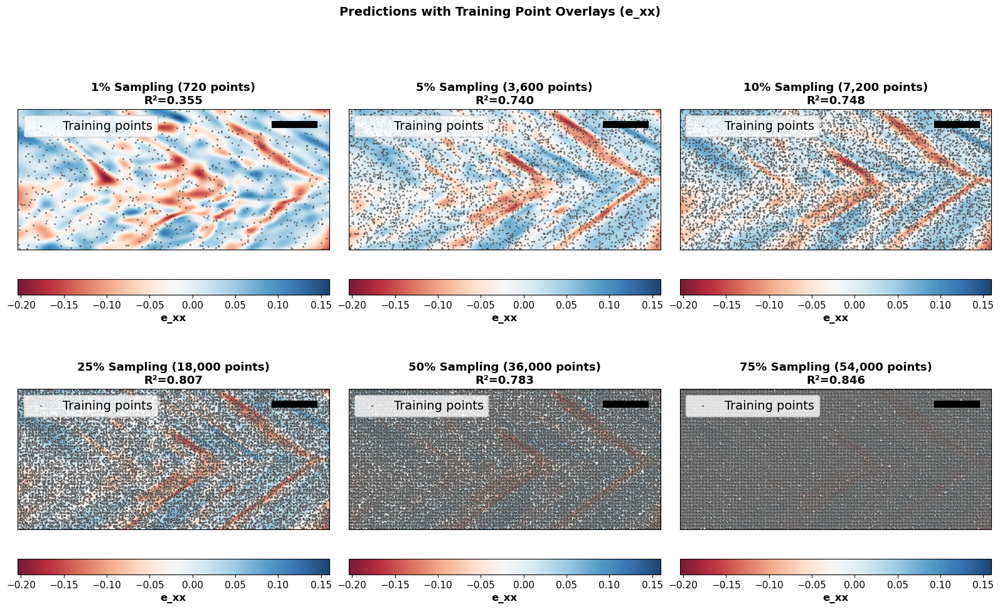

✓ Predictions with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/07_predictions_with_sampling_overlay.png
  Calibration: 17.87 nm/pixel
  Colorbar range: -2.0409e-01 to 1.5949e-01 (consistent across all fractions)


In [16]:
# ============================================================================
# Overlay Sampling Points on Predictions
# ============================================================================

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Predictions with Training Point Overlays (e_xx)', fontsize=14, fontweight='bold')

selected_fracs = [0.01, 0.05, 0.10, 0.25, 0.50, 0.75]

# Pixel-to-nm calibration
calibration_nm_per_pixel = 0.017872741 * 1000  # Convert µm to nm

# Compute consistent colorbar range across all fractions
all_preds = [all_predictions[frac]['e_xx'] for frac in selected_fracs]
valid_mask = mask > 0.5
all_valid_preds = np.concatenate([pred[valid_mask] for pred in all_preds])
vmin_global = np.nanmin(all_valid_preds)
vmax_global = np.nanmax(all_valid_preds)

for idx, frac in enumerate(selected_fracs):
    ax = axes.flat[idx]
    
    # Get predictions for this fraction
    e_xx_pred = all_predictions[frac]['e_xx']
    
    # Show prediction map with consistent colorbar range
    im = ax.imshow(e_xx_pred, cmap='RdBu', origin='lower', vmin=vmin_global, vmax=vmax_global, alpha=0.9)
    
    # Overlay training points as black dots
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='black', s=5, alpha=0.5, edgecolors='white', linewidths=0.3, label='Training points')

    # Add colorbar with larger label fontsize
    cbar = plt.colorbar(im, ax=ax, label='e_xx', location='bottom', pad=0.1)
    cbar.set_label('e_xx', fontsize=12, fontweight='bold')
    
    n_train = int(sparse_mask_np.sum())
    ax.set_title(f'{frac*100:.0f}% Sampling ({n_train:,} points)\nR²={all_metrics[frac]["e_xx"]["R²"]:.3f}', 
                 fontweight='bold', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=14)
    
    # Add scale bar (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "07_predictions_with_sampling_overlay.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Predictions with sampling overlay saved to: {out_dir / '07_predictions_with_sampling_overlay.png'}")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")
print(f"  Colorbar range: {vmin_global:.4e} to {vmax_global:.4e} (consistent across all fractions)")


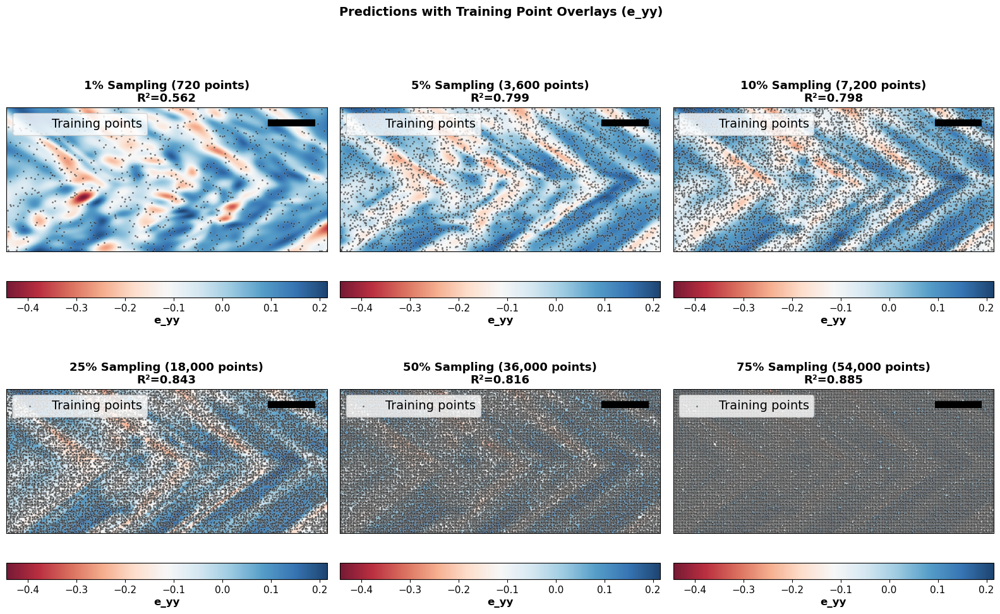

✓ Predictions with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/07b_predictions_with_sampling_overlay_eyy.png
  Calibration: 17.87 nm/pixel
  Colorbar range: -4.4443e-01 to 2.1525e-01 (consistent across all fractions)


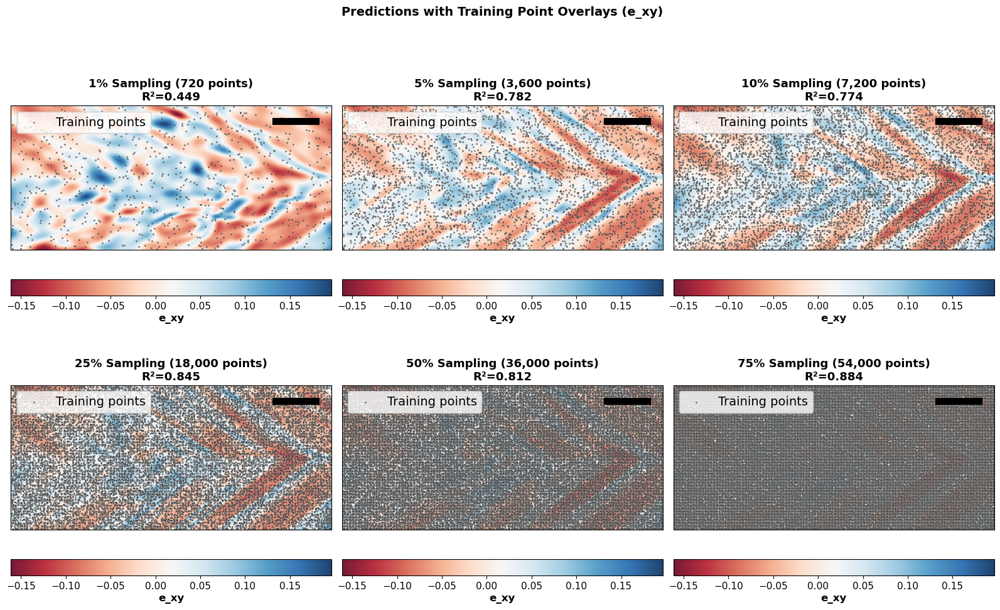

✓ Predictions with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/07c_predictions_with_sampling_overlay_exy.png
  Calibration: 17.87 nm/pixel
  Colorbar range: -1.6162e-01 to 1.9658e-01 (consistent across all fractions)


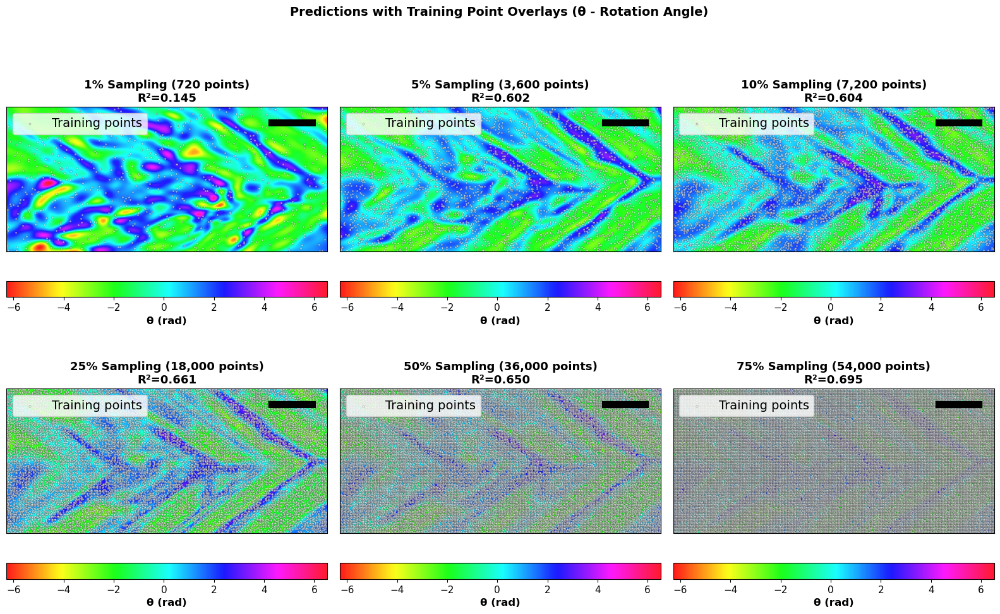

✓ Predictions with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/07d_predictions_with_sampling_overlay_theta.png
  Calibration: 17.87 nm/pixel
  Colorbar range: -6.2886e+00 to 6.5286e+00 (consistent across all fractions)


In [17]:
# ============================================================================
# Overlay Sampling Points on Predictions (e_yy)
# ============================================================================

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Predictions with Training Point Overlays (e_yy)', fontsize=14, fontweight='bold')

selected_fracs = [0.01, 0.05, 0.10, 0.25, 0.50, 0.75]

# Pixel-to-nm calibration
calibration_nm_per_pixel = 0.017872741 * 1000  # Convert µm to nm

# Compute consistent colorbar range across all fractions
all_preds_eyy = [all_predictions[frac]['e_yy'] for frac in selected_fracs]
valid_mask = mask > 0.5
all_valid_preds_eyy = np.concatenate([pred[valid_mask] for pred in all_preds_eyy])
vmin_global_eyy = np.nanmin(all_valid_preds_eyy)
vmax_global_eyy = np.nanmax(all_valid_preds_eyy)

for idx, frac in enumerate(selected_fracs):
    ax = axes.flat[idx]
    
    # Get predictions for this fraction
    e_yy_pred = all_predictions[frac]['e_yy']
    
    # Show prediction map with consistent colorbar range
    im = ax.imshow(e_yy_pred, cmap='RdBu', origin='lower', vmin=vmin_global_eyy, vmax=vmax_global_eyy, alpha=0.9)
    
    # Overlay training points as black dots
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='black', s=5, alpha=0.5, edgecolors='white', linewidths=0.3, label='Training points')

    # Add colorbar with larger label fontsize
    cbar = plt.colorbar(im, ax=ax, label='e_yy', location='bottom', pad=0.1)
    cbar.set_label('e_yy', fontsize=12, fontweight='bold')
    
    n_train = int(sparse_mask_np.sum())
    ax.set_title(f'{frac*100:.0f}% Sampling ({n_train:,} points)\nR²={all_metrics[frac]["e_yy"]["R²"]:.3f}', 
                 fontweight='bold', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=14)
    
    # Add scale bar (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "07b_predictions_with_sampling_overlay_eyy.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Predictions with sampling overlay saved to: {out_dir / '07b_predictions_with_sampling_overlay_eyy.png'}")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")
print(f"  Colorbar range: {vmin_global_eyy:.4e} to {vmax_global_eyy:.4e} (consistent across all fractions)")


# ============================================================================
# Overlay Sampling Points on Predictions (e_xy)
# ============================================================================

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Predictions with Training Point Overlays (e_xy)', fontsize=14, fontweight='bold')

# Compute consistent colorbar range across all fractions
all_preds_exy = [all_predictions[frac]['e_xy'] for frac in selected_fracs]
all_valid_preds_exy = np.concatenate([pred[valid_mask] for pred in all_preds_exy])
vmin_global_exy = np.nanmin(all_valid_preds_exy)
vmax_global_exy = np.nanmax(all_valid_preds_exy)

for idx, frac in enumerate(selected_fracs):
    ax = axes.flat[idx]
    
    # Get predictions for this fraction
    e_xy_pred = all_predictions[frac]['e_xy']
    
    # Show prediction map with consistent colorbar range
    im = ax.imshow(e_xy_pred, cmap='RdBu', origin='lower', vmin=vmin_global_exy, vmax=vmax_global_exy, alpha=0.9)
    
    # Overlay training points as black dots
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='black', s=5, alpha=0.5, edgecolors='white', linewidths=0.3, label='Training points')

    # Add colorbar with larger label fontsize
    cbar = plt.colorbar(im, ax=ax, label='e_xy', location='bottom', pad=0.1)
    cbar.set_label('e_xy', fontsize=12, fontweight='bold')
    
    n_train = int(sparse_mask_np.sum())
    ax.set_title(f'{frac*100:.0f}% Sampling ({n_train:,} points)\nR²={all_metrics[frac]["e_xy"]["R²"]:.3f}', 
                 fontweight='bold', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=14)
    
    # Add scale bar (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "07c_predictions_with_sampling_overlay_exy.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Predictions with sampling overlay saved to: {out_dir / '07c_predictions_with_sampling_overlay_exy.png'}")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")
print(f"  Colorbar range: {vmin_global_exy:.4e} to {vmax_global_exy:.4e} (consistent across all fractions)")


# ============================================================================
# Overlay Sampling Points on Predictions (theta - rotation angle)
# ============================================================================

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Predictions with Training Point Overlays (θ - Rotation Angle)', fontsize=14, fontweight='bold')

# Compute consistent colorbar range across all fractions
all_preds_theta = [all_predictions[frac]['theta'] for frac in selected_fracs]
all_valid_preds_theta = np.concatenate([pred[valid_mask] for pred in all_preds_theta])
vmin_global_theta = np.nanmin(all_valid_preds_theta)
vmax_global_theta = np.nanmax(all_valid_preds_theta)

for idx, frac in enumerate(selected_fracs):
    ax = axes.flat[idx]
    
    # Get predictions for this fraction
    theta_pred = all_predictions[frac]['theta']
    
    # Show prediction map with consistent colorbar range
    im = ax.imshow(theta_pred, cmap='hsv', origin='lower', vmin=vmin_global_theta, vmax=vmax_global_theta, alpha=0.9)
    
    # Overlay training points as black dots
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='white', s=5, alpha=0.5, edgecolors='black', linewidths=0.3, label='Training points')

    # Add colorbar with larger label fontsize
    cbar = plt.colorbar(im, ax=ax, label='θ (rad)', location='bottom', pad=0.1)
    cbar.set_label('θ (rad)', fontsize=12, fontweight='bold')
    
    n_train = int(sparse_mask_np.sum())
    ax.set_title(f'{frac*100:.0f}% Sampling ({n_train:,} points)\nR²={all_metrics[frac]["theta"]["R²"]:.3f}', 
                 fontweight='bold', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=14)
    
    # Add scale bar (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "07d_predictions_with_sampling_overlay_theta.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Predictions with sampling overlay saved to: {out_dir / '07d_predictions_with_sampling_overlay_theta.png'}")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")
print(f"  Colorbar range: {vmin_global_theta:.4e} to {vmax_global_theta:.4e} (consistent across all fractions)")

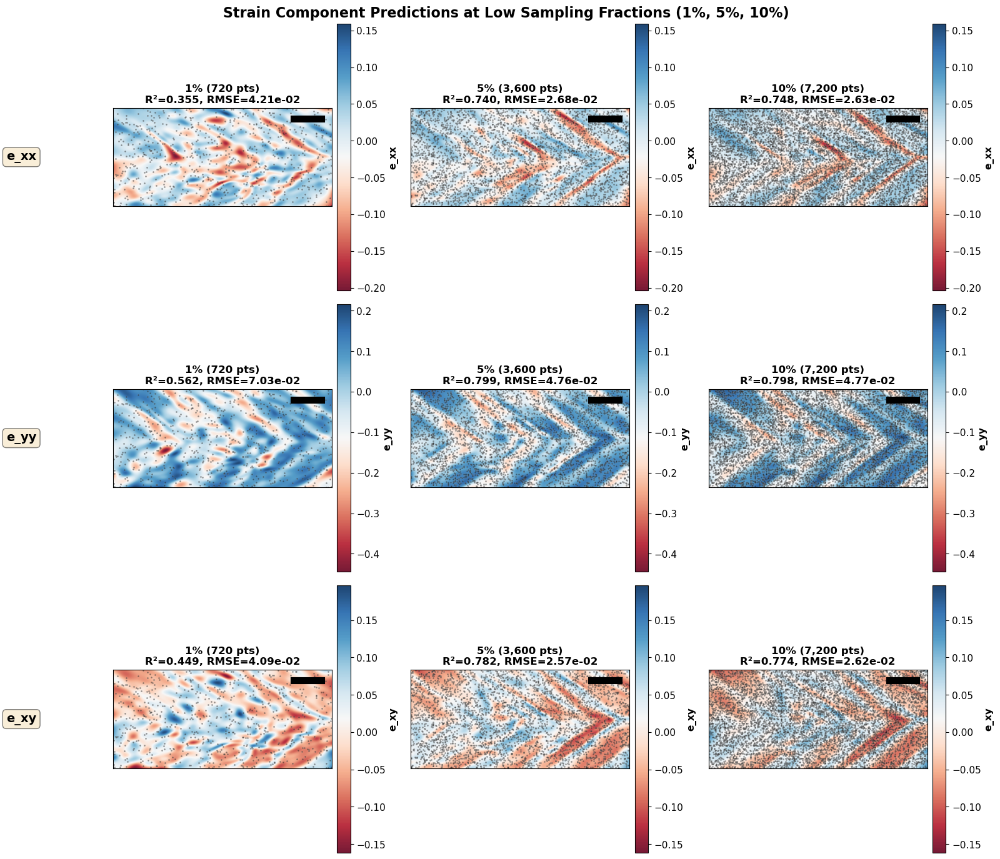

✓ Combined predictions (e_xx, e_yy, e_xy at 1%, 5%, 10%) saved
  Calibration: 17.87 nm/pixel

  Component ranges (consistent colorbars):
    e_xx  : -2.0409e-01 to 1.5949e-01
    e_yy  : -4.4443e-01 to 2.1525e-01
    e_xy  : -1.6162e-01 to 1.9658e-01


In [18]:
# ============================================================================
# Combined Predictions: e_xx, e_yy, e_xy at 1%, 5%, 10% Sampling
# ============================================================================

fig, axes = plt.subplots(3, 3, figsize=(16, 14))
fig.suptitle('Strain Component Predictions at Low Sampling Fractions (1%, 5%, 10%)', 
             fontsize=16, fontweight='bold')

selected_fracs = [0.01, 0.05, 0.10]
components = ['e_xx', 'e_yy', 'e_xy']

# Pixel-to-nm calibration
calibration_nm_per_pixel = 0.017872741 * 1000  # Convert µm to nm

# Compute consistent colorbars for each component across all fractions
component_ranges = {}
for comp in components:
    all_preds_comp = [all_predictions[frac][comp] for frac in selected_fracs]
    valid_mask = mask > 0.5
    all_valid_preds_comp = np.concatenate([pred[valid_mask] for pred in all_preds_comp])
    vmin_comp = np.nanmin(all_valid_preds_comp)
    vmax_comp = np.nanmax(all_valid_preds_comp)
    component_ranges[comp] = (vmin_comp, vmax_comp)

# Plot in grid: rows = components, columns = sampling fractions
for row, component in enumerate(components):
    vmin_c, vmax_c = component_ranges[component]
    
    for col, frac in enumerate(selected_fracs):
        ax = axes[row, col]
        
        # Get prediction
        pred = all_predictions[frac][component]
        
        # Show prediction map with consistent colorbar range for this component
        im = ax.imshow(pred, cmap='RdBu', origin='lower', vmin=vmin_c, vmax=vmax_c, alpha=0.9)
        
        # Overlay training points as black dots
        sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
        y_pts, x_pts = np.where(sparse_mask_np > 0.5)
        ax.scatter(x_pts, y_pts, c='black', s=4, alpha=0.4, edgecolors='white', 
                  linewidths=0.2, label='Training points')
        
        # Add colorbar
        cbar = plt.colorbar(im, ax=ax, label=component, location='right', pad=0.02)
        cbar.set_label(component, fontsize=11, fontweight='bold')
        
        # Title with metrics
        n_train = int(sparse_mask_np.sum())
        r2 = all_metrics[frac][component]['R²']
        rmse = all_metrics[frac][component]['RMSE']
        
        if col == 0:
            # Add component label on left
            ax.text(-0.35, 0.5, component, transform=ax.transAxes, 
                   fontsize=14, fontweight='bold', va='center', ha='right',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        
        ax.set_title(f'{frac*100:.0f}% ({n_train:,} pts)\nR²={r2:.3f}, RMSE={rmse:.2e}', 
                    fontweight='bold', fontsize=12)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Add scale bar (in nm, no label)
        scale_length_px = W // 8
        bar_x_start = W - scale_length_px - 20
        bar_x_end = W - 20
        bar_y = H - 20
        ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "10_combined_predictions_1_5_10pct.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Combined predictions (e_xx, e_yy, e_xy at 1%, 5%, 10%) saved")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")
print(f"\n  Component ranges (consistent colorbars):")
for comp, (vmin, vmax) in component_ranges.items():
    print(f"    {comp:6s}: {vmin:.4e} to {vmax:.4e}")

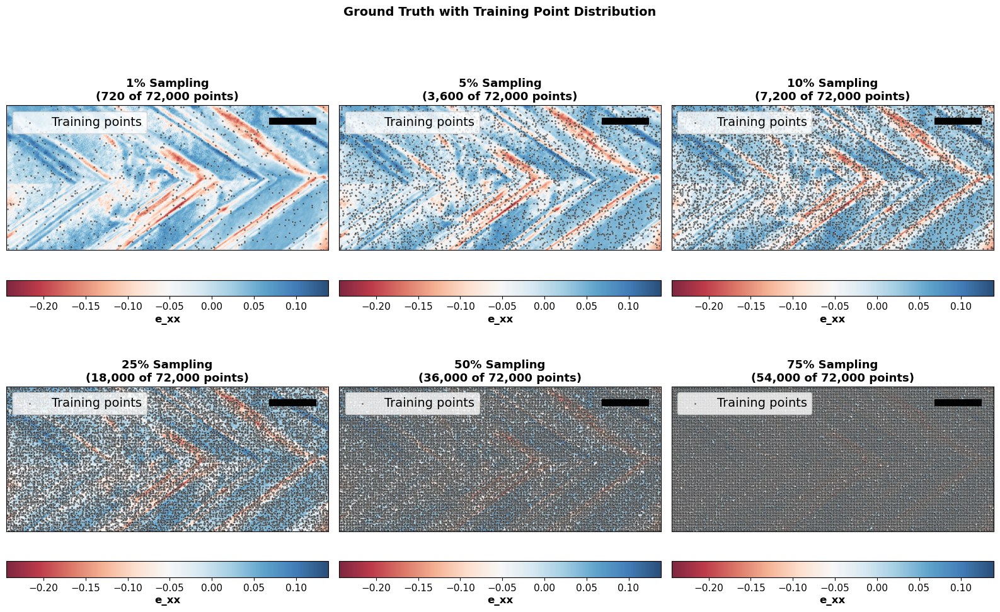

✓ Ground truth with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/08_ground_truth_with_sampling_overlay.png
  Calibration: 17.87 nm/pixel


In [19]:
# Ground truth with sampling overlays
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Ground Truth with Training Point Distribution', fontsize=14, fontweight='bold')

# Pixel-to-nm calibration
calibration_nm_per_pixel = 0.017872741 * 1000  # Convert µm to nm

for idx, frac in enumerate([0.01, 0.05, 0.10, 0.25, 0.50, 0.75]):
    ax = axes.flat[idx]
    
    # Show ground truth with consistent colorbar
    valid_gt = e_xx[mask > 0.5]
    vmin, vmax = np.nanmin(valid_gt), np.nanmax(valid_gt)
    im = ax.imshow(e_xx, cmap='RdBu', origin='lower', vmin=vmin, vmax=vmax, alpha=0.85)
    
    # Overlay training points
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='black', s=5, alpha=0.5, edgecolors='white', linewidths=0.3, label='Training points')
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, label='e_xx (ground truth)', location='bottom', pad=0.1)
    cbar.set_label('e_xx', fontsize=12, fontweight='bold')
    
    n_train = int(sparse_mask_np.sum())
    n_valid = int(mask.sum())
    ax.set_title(f'{frac*100:.0f}% Sampling\n({n_train:,} of {n_valid:,} points)', 
                 fontweight='bold', fontsize=13)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend(loc='upper left', fontsize=14)
    
    # Add scale bar at bottom right (in nm, no label)
    scale_length_px = W // 8  # 1/8 of width in pixels
    bar_x_start = W - scale_length_px - 20
    bar_x_end = W - 20
    bar_y = H - 20
    ax.plot([bar_x_start, bar_x_end], [bar_y, bar_y], 'k-', linewidth=8)

plt.tight_layout()
plt.savefig(out_dir / "08_ground_truth_with_sampling_overlay.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Ground truth with sampling overlay saved to: {out_dir / '08_ground_truth_with_sampling_overlay.png'}")
print(f"  Calibration: {calibration_nm_per_pixel:.2f} nm/pixel")


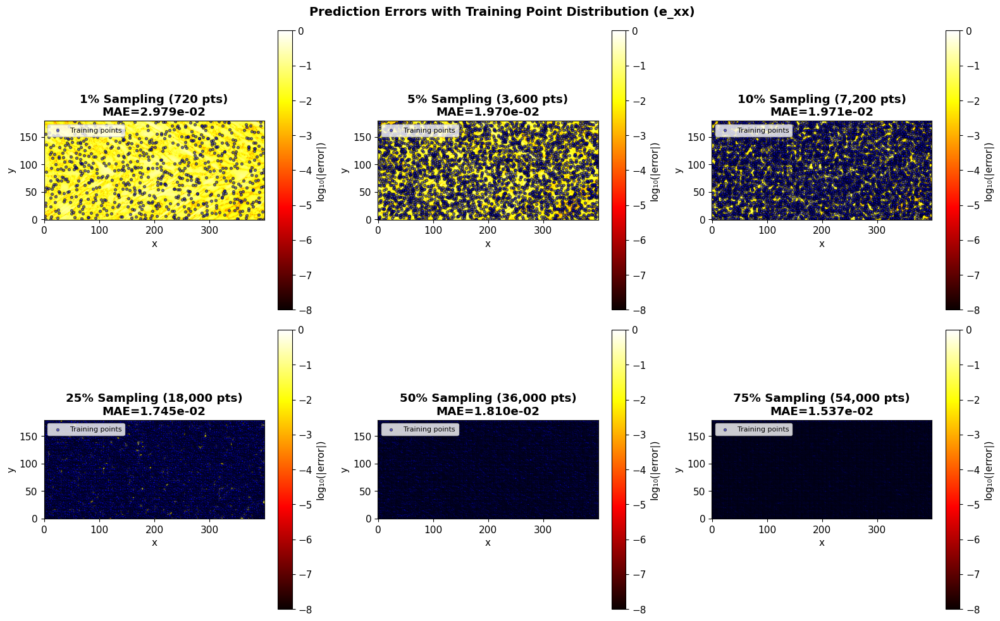

✓ Error maps with sampling overlay saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/09_error_maps_with_sampling_overlay.png


In [20]:
# Error maps with sampling overlays - showing where model struggles
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Prediction Errors with Training Point Distribution (e_xx)', fontsize=14, fontweight='bold')

for idx, frac in enumerate([0.01, 0.05, 0.10, 0.25, 0.50, 0.75]):
    ax = axes.flat[idx]
    
    # Compute absolute error
    e_xx_pred = all_predictions[frac]['e_xx']
    error_map = np.abs(e_xx_pred - e_xx)
    
    # Mask invalid regions
    error_display = np.copy(error_map)
    error_display[mask < 0.5] = 0.0
    
    # Use log scale for better visualization
    error_log = np.log10(error_display + 1e-10)
    vmin, vmax = -8, 0
    im = ax.imshow(error_log, cmap='hot', origin='lower', vmin=vmin, vmax=vmax)
    
    # Overlay training points
    sparse_mask_np = sparse_masks[frac].cpu().numpy().reshape(H, W)
    y_pts, x_pts = np.where(sparse_mask_np > 0.5)
    ax.scatter(x_pts, y_pts, c='blue', s=8, alpha=0.5, edgecolors='black', label='Training points')
    
    cbar = plt.colorbar(im, ax=ax, label='log₁₀(|error|)')
    n_train = int(sparse_mask_np.sum())
    mae = all_metrics[frac]['e_xx']['MAE']
    ax.set_title(f'{frac*100:.0f}% Sampling ({n_train:,} pts)\nMAE={mae:.3e}', fontweight='bold')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.legend(loc='upper left', fontsize=8)

plt.tight_layout()
plt.savefig(out_dir / "09_error_maps_with_sampling_overlay.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Error maps with sampling overlay saved to: {out_dir / '09_error_maps_with_sampling_overlay.png'}")


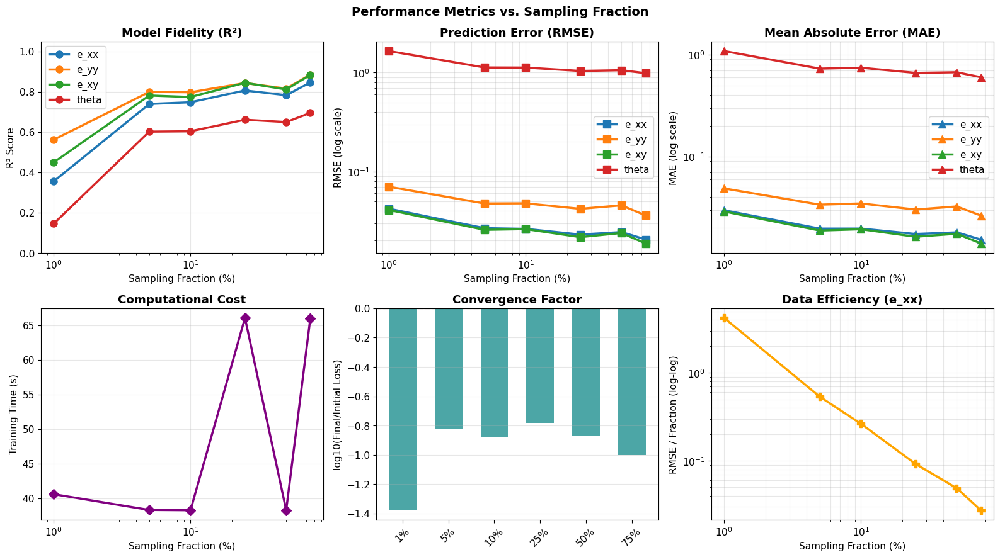

✓ Comprehensive metrics comparison saved


In [21]:
# 4. Metrics vs. Sampling Fraction (comprehensive comparison)
fig, axes = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('Performance Metrics vs. Sampling Fraction', fontsize=14, fontweight='bold')

fracs_pct = [f*100 for f in config["sampling_fractions"]]

# R² score
ax = axes[0, 0]
for component in ['e_xx', 'e_yy', 'e_xy', 'theta']:
    r2_values = [all_metrics[f][component]['R²'] for f in config["sampling_fractions"]]
    ax.plot(fracs_pct, r2_values, marker='o', linewidth=2.5, markersize=8, label=component)
ax.set_xscale('log')
ax.set_xlabel('Sampling Fraction (%)', fontsize=11)
ax.set_ylabel('R² Score', fontsize=11)
ax.set_title('Model Fidelity (R²)', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_ylim([0, 1.05])

# RMSE
ax = axes[0, 1]
for component in ['e_xx', 'e_yy', 'e_xy', 'theta']:
    rmse_values = [all_metrics[f][component]['RMSE'] for f in config["sampling_fractions"]]
    ax.semilogy(fracs_pct, rmse_values, marker='s', linewidth=2.5, markersize=8, label=component)
ax.set_xscale('log')
ax.set_xlabel('Sampling Fraction (%)', fontsize=11)
ax.set_ylabel('RMSE (log scale)', fontsize=11)
ax.set_title('Prediction Error (RMSE)', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3, which='both')

# MAE
ax = axes[0, 2]
for component in ['e_xx', 'e_yy', 'e_xy', 'theta']:
    mae_values = [all_metrics[f][component]['MAE'] for f in config["sampling_fractions"]]
    ax.semilogy(fracs_pct, mae_values, marker='^', linewidth=2.5, markersize=8, label=component)
ax.set_xscale('log')
ax.set_xlabel('Sampling Fraction (%)', fontsize=11)
ax.set_ylabel('MAE (log scale)', fontsize=11)
ax.set_title('Mean Absolute Error (MAE)', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3, which='both')

# Training time vs sampling
ax = axes[1, 0]
times = [training_times[f] for f in config["sampling_fractions"]]
ax.plot(fracs_pct, times, marker='D', linewidth=2.5, markersize=8, color='purple')
ax.set_xscale('log')
ax.set_xlabel('Sampling Fraction (%)', fontsize=11)
ax.set_ylabel('Training Time (s)', fontsize=11)
ax.set_title('Computational Cost', fontweight='bold')
ax.grid(True, alpha=0.3)

# Convergence speed (log10 of final loss / initial loss)
ax = axes[1, 1]
convergence = []
for f in config["sampling_fractions"]:
    hist = training_histories[f]
    conv = np.log10(hist['loss_total'][-1] / hist['loss_total'][0])
    convergence.append(conv)
ax.bar(range(len(fracs_pct)), convergence, color='teal', alpha=0.7, width=0.6)
ax.set_xticks(range(len(fracs_pct)))
ax.set_xticklabels([f'{f:.0f}%' for f in fracs_pct], rotation=45)
ax.set_ylabel('log10(Final/Initial Loss)', fontsize=11)
ax.set_title('Convergence Factor', fontweight='bold')
ax.axhline(0, color='k', linestyle='--', alpha=0.5)
ax.grid(True, alpha=0.3, axis='y')

# Data efficiency (RMSE gain per 1% additional data)
ax = axes[1, 2]
rmse_ref = all_metrics[config["sampling_fractions"][-1]]['e_xx']['RMSE']  # 100% reference (if available)
rmse_e_xx = [all_metrics[f]['e_xx']['RMSE'] for f in config["sampling_fractions"]]
efficiency = [rmse_e_xx[i] / (fracs_pct[i] / 100 + 1e-6) for i in range(len(fracs_pct))]
ax.loglog(fracs_pct, efficiency, marker='P', linewidth=2.5, markersize=8, color='orange')
ax.set_xlabel('Sampling Fraction (%)', fontsize=11)
ax.set_ylabel('RMSE / Fraction (log-log)', fontsize=11)
ax.set_title('Data Efficiency (e_xx)', fontweight='bold')
ax.grid(True, alpha=0.3, which='both')

plt.tight_layout()
plt.savefig(out_dir / "05_metrics_comparison.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Comprehensive metrics comparison saved")

/var/folders/r1/jgb817xs44qfx69d473y6rcm0000gn/T/ipykernel_31999/3606328050.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(error_data, labels=labels_plot, patch_artist=True)
/var/folders/r1/jgb817xs44qfx69d473y6rcm0000gn/T/ipykernel_31999/3606328050.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(error_data, labels=labels_plot, patch_artist=True)
/var/folders/r1/jgb817xs44qfx69d473y6rcm0000gn/T/ipykernel_31999/3606328050.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(error_data, labels=labels_plot, patch_artist=True)
/var/folders/r1/jgb817xs44qfx69d473y6

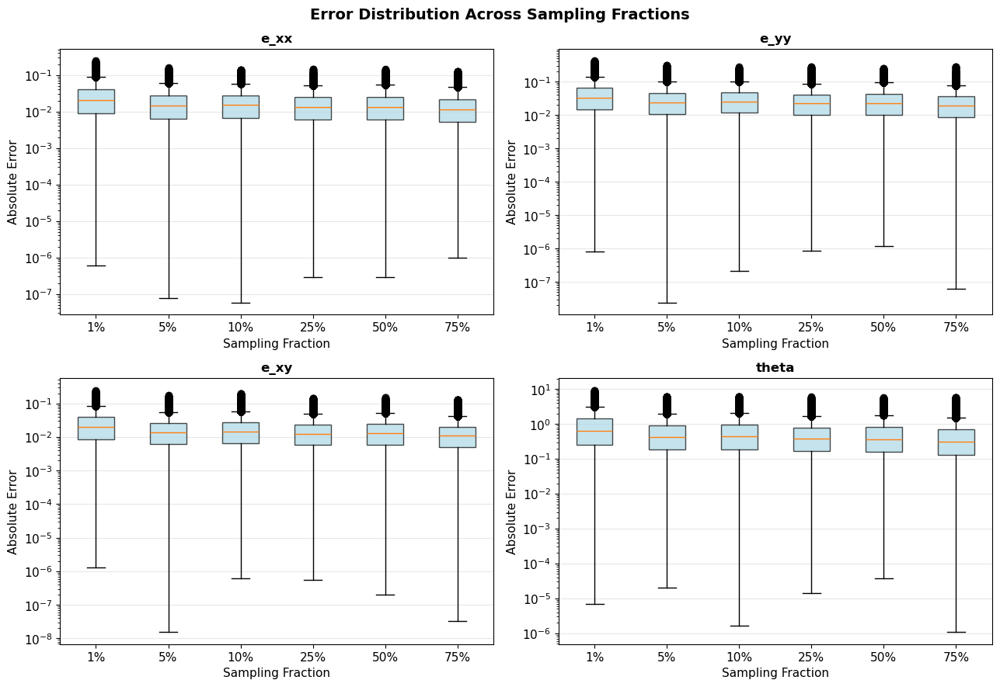

✓ Error distributions saved


In [23]:
# 5. Box plots of errors across all fractions
fig, axes = plt.subplots(2, 2, figsize=(13, 9))
fig.suptitle('Error Distribution Across Sampling Fractions', fontsize=14, fontweight='bold')

for idx, component in enumerate(['e_xx', 'e_yy', 'e_xy', 'theta']):
    ax = axes.flat[idx]
    
    error_data = []
    labels_plot = []
    for frac in config["sampling_fractions"]:
        pred = all_predictions[frac][component]
        true = [e_xx, e_yy, e_xy, theta][idx]
        errors = np.abs(pred[mask > 0.5] - true[mask > 0.5])
        error_data.append(errors)
        labels_plot.append(f'{frac*100:.0f}%')
    
    bp = ax.boxplot(error_data, labels=labels_plot, patch_artist=True)
    for patch in bp['boxes']:
        patch.set_facecolor('lightblue')
        patch.set_alpha(0.7)
    
    ax.set_ylabel('Absolute Error', fontsize=11)
    ax.set_xlabel('Sampling Fraction', fontsize=11)
    ax.set_title(f'{component}', fontweight='bold', fontsize=12)
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_yscale('log')

plt.tight_layout()
plt.savefig(out_dir / "06_error_distributions.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Error distributions saved")

In [24]:
# 6. Comprehensive summary table
print("\n" + "="*70)
print("FINAL RESULTS: Comprehensive Performance Summary")
print("="*70)

summary_rows = []
for frac in config["sampling_fractions"]:
    row = {
        'Sampling %': f'{frac*100:.1f}%',
        'Train Points': int((sparse_masks[frac].sum()).item()),
        '% of Grid': f'{100*int((sparse_masks[frac].sum()).item())/(H*W):.1f}%',
        'R² (e_xx)': f'{all_metrics[frac]["e_xx"]["R²"]:.4f}',
        'RMSE (e_xx)': f'{all_metrics[frac]["e_xx"]["RMSE"]:.4e}',
        'R² (avg)': f'{np.mean([all_metrics[frac][c]["R²"] for c in ["e_xx", "e_yy", "e_xy", "theta"]]):.4f}',
        'Time (s)': f'{training_times[frac]:.1f}',
        'Epochs': len(training_histories[frac]['epoch']),
    }
    summary_rows.append(row)

summary_table = pd.DataFrame(summary_rows)
print(summary_table.to_string(index=False))

# Save summary to CSV
csv_out = out_dir / "results_summary.csv"
summary_table.to_csv(csv_out, index=False)
print(f"\n✓ Summary saved to: {csv_out}")

# Save detailed metrics to CSV
detailed_metrics_list = []
for frac in config["sampling_fractions"]:
    for component in ['e_xx', 'e_yy', 'e_xy', 'theta']:
        for metric_name, metric_val in all_metrics[frac][component].items():
            detailed_metrics_list.append({
                'Sampling %': frac * 100,
                'Component': component,
                'Metric': metric_name,
                'Value': metric_val,
            })

detailed_df = pd.DataFrame(detailed_metrics_list)
detailed_csv = out_dir / "detailed_metrics.csv"
detailed_df.to_csv(detailed_csv, index=False)
print(f"✓ Detailed metrics saved to: {detailed_csv}")

print("\n" + "="*70)
print("KEY INSIGHTS")
print("="*70)

# Best performance
best_r2_frac = max(config["sampling_fractions"], key=lambda f: all_metrics[f]['e_xx']['R²'])
print(f"  ✓ Best e_xx R² achieved at: {best_r2_frac*100:.1f}% sampling (R²={all_metrics[best_r2_frac]['e_xx']['R²']:.4f})")

# Data efficiency sweet spot
print(f"  ✓ Recommendation for high accuracy (~0.90 R²):")
for frac in config["sampling_fractions"]:
    if all_metrics[frac]['e_xx']['R²'] > 0.90:
        print(f"      Use ≥{frac*100:.0f}% data (RMSE={all_metrics[frac]['e_xx']['RMSE']:.4e})")
        break

print(f"  ✓ Computational efficiency: Training times range from {min(training_times.values()):.1f}s to {max(training_times.values()):.1f}s")
print(f"  ✓ Total training time: {total_time:.1f}s")
print("\n" + "="*70)


FINAL RESULTS: Comprehensive Performance Summary
Sampling %  Train Points % of Grid R² (e_xx) RMSE (e_xx) R² (avg) Time (s)  Epochs
      1.0%           720      1.0%    0.3552  4.2132e-02   0.3779     40.6    2899
      5.0%          3600      5.0%    0.7397  2.6767e-02   0.7308     38.3    2900
     10.0%          7200     10.0%    0.7480  2.6337e-02   0.7311     38.3    2900
     25.0%         18000     25.0%    0.8068  2.3062e-02   0.7891     66.1    5000
     50.0%         36000     50.0%    0.7832  2.4431e-02   0.7651     38.3    2890
     75.0%         54000     75.0%    0.8463  2.0573e-02   0.8276     66.0    5000

✓ Summary saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/results_summary.csv
✓ Detailed metrics saved to: /Users/robertodosreis/Documents/codes/pinns-4dstem/outputs/sota_adaptive-2/detailed_metrics.csv

KEY INSIGHTS
  ✓ Best e_xx R² achieved at: 75.0% sampling (R²=0.8463)
  ✓ Recommendation for high accuracy (~0.90 R²):
  ✓ Comp

In [ ]:
# ============================================================================
# SECTION 10: Bayesian Epistemic Uncertainty (MC Dropout + MFVI)
# ============================================================================

# --- MC Dropout SIREN ---
class StrainPINN_MCDropout(nn.Module):
    def __init__(self, hidden_dim=128, num_layers=6, omega_0=1.0, drop_p=0.1):
        super().__init__()
        self.drop = nn.Dropout(p=drop_p)
        self.first = SirenLayer(2, hidden_dim, is_first=True, omega_0=omega_0)
        self.hidden_layers = nn.ModuleList([
            SirenLayer(hidden_dim, hidden_dim, is_first=False, omega_0=omega_0)
            for _ in range(num_layers - 2)
        ])
        self.skip_proj = nn.Linear(hidden_dim, hidden_dim)
        self.final = nn.Linear(hidden_dim, 4)
        with torch.no_grad():
            self.final.weight.uniform_(-np.sqrt(6 / hidden_dim), np.sqrt(6 / hidden_dim))

    def forward(self, x):
        x_h = self.drop(self.first(x))
        for i, layer in enumerate(self.hidden_layers):
            if i % 2 == 0 and i > 0:
                x_h = layer(x_h) + self.skip_proj(x_h)
            else:
                x_h = layer(x_h)
            x_h = self.drop(x_h)
        return self.final(x_h)

    def predict_uncertainty(self, x, T=50):
        self.train()  # keep dropout active
        with torch.no_grad():
            preds = torch.stack([self(x) for _ in range(T)], dim=0)
        return preds.mean(0), preds.std(0)


# --- Mean-Field Variational Inference SIREN ---
class BayesLinear(nn.Module):
    def __init__(self, in_features, out_features, prior_std=0.1):
        super().__init__()
        self.w_mu  = nn.Parameter(torch.zeros(out_features, in_features))
        self.w_rho = nn.Parameter(torch.full((out_features, in_features), -5.0))
        self.b_mu  = nn.Parameter(torch.zeros(out_features))
        self.b_rho = nn.Parameter(torch.full((out_features,), -5.0))
        self.prior_var = prior_std ** 2
        nn.init.kaiming_uniform_(self.w_mu, a=np.sqrt(5))

    @property
    def w_sig(self): return torch.log1p(torch.exp(self.w_rho))
    @property
    def b_sig(self): return torch.log1p(torch.exp(self.b_rho))

    def forward(self, x):
        if self.training:
            w = self.w_mu + self.w_sig * torch.randn_like(self.w_mu)
            b = self.b_mu + self.b_sig * torch.randn_like(self.b_mu)
        else:
            w, b = self.w_mu, self.b_mu
        return nn.functional.linear(x, w, b)

    def kl(self):
        pv = self.prior_var
        kl_w = 0.5 * ((self.w_sig**2 + self.w_mu**2) / pv - 1.0
                      - torch.log(self.w_sig**2 / pv))
        kl_b = 0.5 * ((self.b_sig**2 + self.b_mu**2) / pv - 1.0
                      - torch.log(self.b_sig**2 / pv))
        return kl_w.sum() + kl_b.sum()


class SirenBayes(nn.Module):
    def __init__(self, in_f, out_f, is_first=False, omega_0=1.0):
        super().__init__()
        self.omega_0 = omega_0
        self.linear = BayesLinear(in_f, out_f)
        with torch.no_grad():
            if is_first:
                self.linear.w_mu.uniform_(-1 / in_f, 1 / in_f)
            else:
                bound = np.sqrt(6 / in_f) / omega_0
                self.linear.w_mu.uniform_(-bound, bound)
    def forward(self, x): return torch.sin(self.omega_0 * self.linear(x))
    def kl(self):         return self.linear.kl()


class StrainPINN_MFVI(nn.Module):
    def __init__(self, hidden_dim=128, num_layers=6, omega_0=1.0):
        super().__init__()
        self._omega_0 = omega_0
        self.first = SirenBayes(2, hidden_dim, is_first=True, omega_0=omega_0)
        self.hidden_layers = nn.ModuleList([
            SirenBayes(hidden_dim, hidden_dim, omega_0=omega_0)
            for _ in range(num_layers - 2)
        ])
        self.skip_proj = BayesLinear(hidden_dim, hidden_dim)
        self.final     = BayesLinear(hidden_dim, 4)

    def forward(self, x):
        x_h = self.first(x)
        for i, layer in enumerate(self.hidden_layers):
            if i % 2 == 0 and i > 0:
                x_h = layer(x_h) + torch.sin(self._omega_0 * self.skip_proj(x_h))
            else:
                x_h = layer(x_h)
        return self.final(x_h)

    def kl_total(self):
        kl = self.first.kl() + self.skip_proj.kl() + self.final.kl()
        for l in self.hidden_layers: kl += l.kl()
        return kl

    def predict_uncertainty(self, x, T=50):
        self.train()
        with torch.no_grad():
            preds = torch.stack([self(x) for _ in range(T)], dim=0)
        return preds.mean(0), preds.std(0)


# --- Shared Bayesian Training Loop ---
def train_bayes_model(model, sparse_mask, n_epochs=3000, lr=1e-3, kl_scale=1e-6):
    opt   = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0)
    sched = torch.optim.lr_scheduler.StepLR(opt, step_size=500, gamma=0.95)
    for epoch in trange(n_epochs, desc=model.__class__.__name__, leave=False):
        model.train()
        opt.zero_grad()
        total, ld, lp = pinn_loss_with_physics(
            model, x_flat, y_flat,
            e_xx_scaled, e_yy_scaled, e_xy_scaled, theta_scaled,
            sparse_mask, H, W, device, config
        )
        dev = next(model.parameters()).device
        kl = model.kl_total() * kl_scale if hasattr(model, 'kl_total') else torch.zeros(1, device=dev).squeeze()
        loss = total + kl
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step()
        sched.step()


# --- Train at 10% sampling ---
TARGET_FRAC = 0.10
T_PASSES    = 150
sparse_10   = sparse_masks[TARGET_FRAC]

print('Training MC-Dropout PINN at 10% sampling ...')
mcd_model = StrainPINN_MCDropout(
    hidden_dim=config['hidden_dim'], num_layers=config['num_layers']
).to(device)
train_bayes_model(mcd_model, sparse_10, n_epochs=3000)

print('Training MFVI PINN at 10% sampling ...')
mfvi_model = StrainPINN_MFVI(
    hidden_dim=config['hidden_dim'], num_layers=config['num_layers']
).to(device)
train_bayes_model(mfvi_model, sparse_10, n_epochs=3000, kl_scale=1e-6)

print('Running stochastic inference ...')
inputs_all = torch.stack([x_flat, y_flat], dim=1)
mcd_mean_s,  mcd_std_s  = mcd_model.predict_uncertainty(inputs_all,  T=T_PASSES)
mfvi_mean_s, mfvi_std_s = mfvi_model.predict_uncertainty(inputs_all, T=T_PASSES)

def _to_map(t_scaled, name, H, W, mask_np):
    arr = unscale(t_scaled[:, 0], name).cpu().numpy().reshape(H, W)
    arr[~(mask_np > 0.5)] = np.nan
    return arr

def _std_map(t_std, H, W, mask_np):
    arr = t_std[:, 0].cpu().numpy().reshape(H, W)
    arr[~(mask_np > 0.5)] = np.nan
    return arr

mcd_mean  = _to_map(mcd_mean_s,  'e_xx', H, W, mask)
mfvi_mean = _to_map(mfvi_mean_s, 'e_xx', H, W, mask)
mcd_std   = _std_map(mcd_std_s,  H, W, mask)
mfvi_std  = _std_map(mfvi_std_s, H, W, mask)
print('Uncertainty maps computed')

# --- Figure 6 ---
# --- Figure 6  (colorbar bottom, large fonts) ---
FS6     = 14
FS6_T   = 15
FS6_SUP = 15

valid_m = mask > 0.5
gt_plot = np.where(valid_m, e_xx, np.nan)
all_means = np.concatenate([mcd_mean[valid_m], mfvi_mean[valid_m], gt_plot[valid_m]])
vmin_m = float(np.nanpercentile(all_means, 2))
vmax_m = float(np.nanpercentile(all_means, 98))
all_stds = np.concatenate([mcd_std[valid_m], mfvi_std[valid_m]])
vmax_s   = float(np.nanpercentile(all_stds, 98))

def _cb6(im, ax, label):
    cb = plt.colorbar(im, ax=ax, location='bottom', pad=0.06, shrink=0.85)
    cb.set_label(label, fontsize=FS6)
    cb.ax.tick_params(labelsize=FS6 - 2)
    return cb

fig, axes = plt.subplots(2, 3, figsize=(15, 12))

# Row 0: GT | MCD mean | MCD std
im = axes[0,0].imshow(gt_plot,   cmap='RdBu',   origin='lower', vmin=vmin_m, vmax=vmax_m)
axes[0,0].set_title('Ground Truth $\\varepsilon_{xx}$', fontsize=FS6_T, fontweight='bold')
_cb6(im, axes[0,0], '$\\varepsilon_{xx}$')

im = axes[0,1].imshow(mcd_mean,  cmap='RdBu',   origin='lower', vmin=vmin_m, vmax=vmax_m)
axes[0,1].set_title('MC Dropout - Mean', fontsize=FS6_T, fontweight='bold')
_cb6(im, axes[0,1], '$\\varepsilon_{xx}$')

im = axes[0,2].imshow(mcd_std,   cmap='YlOrRd', origin='lower', vmin=0, vmax=vmax_s)
axes[0,2].set_title('MC Dropout - Std (Epistemic)', fontsize=FS6_T, fontweight='bold')
_cb6(im, axes[0,2], 'Uncertainty (std)')

# Row 1: sampling overlay | MFVI mean | MFVI std
sp_np = sparse_masks[TARGET_FRAC].cpu().numpy().reshape(H, W)
axes[1,0].imshow(gt_plot, cmap='RdBu', origin='lower', vmin=vmin_m, vmax=vmax_m, alpha=0.45)
yp, xp = np.where(sp_np > 0.5)
axes[1,0].scatter(xp, yp, c='black', s=5, alpha=0.65, linewidths=0)
axes[1,0].set_title(f'Training Points (10%, n={int(sp_np.sum()):,})', fontsize=FS6_T, fontweight='bold')

im = axes[1,1].imshow(mfvi_mean, cmap='RdBu',   origin='lower', vmin=vmin_m, vmax=vmax_m)
axes[1,1].set_title('MFVI - Mean', fontsize=FS6_T, fontweight='bold')
_cb6(im, axes[1,1], '$\\varepsilon_{xx}$')

im = axes[1,2].imshow(mfvi_std,  cmap='YlOrRd', origin='lower', vmin=0, vmax=vmax_s)
axes[1,2].set_title('MFVI - Std (Epistemic)', fontsize=FS6_T, fontweight='bold')
_cb6(im, axes[1,2], 'Uncertainty (std)')

for ax in axes.flat:
    ax.set_xticks([]); ax.set_yticks([])

plt.suptitle(
    f'Bayesian Epistemic Uncertainty -- $\\varepsilon_{{xx}}$ at 10% Sparse Data (T = {T_PASSES})',
    fontsize=FS6_SUP, fontweight='bold'
)
plt.tight_layout()
fig.savefig(out_dir / 'fig6_uq_exx.png', dpi=200, bbox_inches='tight')
plt.show()
print(f'Saved: {out_dir / "fig6_uq_exx.png"}')


In [ ]:
# ============================================================================
# PAPER FIGURE EXPORT
# Creates paper/Fig/ and saves all 7 publication-ready figures
# ============================================================================
import shutil

PDPI   = 300
FS     = 14   # base font size for labels / ticks
FS_T   = 15   # subplot title
FS_SUP = 16   # suptitle
paper_dir = Path('paper/Fig')
paper_dir.mkdir(parents=True, exist_ok=True)
print(f'Output: {paper_dir.resolve()}')

valid_m = mask > 0.5

def _cbar_bottom(im, ax, label):
    cb = plt.colorbar(im, ax=ax, location='bottom', pad=0.06, shrink=0.85)
    cb.set_label(label, fontsize=FS)
    cb.ax.tick_params(labelsize=FS - 2)
    return cb

# ---- fig1_raw_data.png  (colorbar bottom, large fonts) ----------------
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
panels = [
    (e_xx,  '$\\varepsilon_{xx}$',   'RdBu'),
    (e_yy,  '$\\varepsilon_{yy}$',   'RdBu'),
    (e_xy,  '$\\varepsilon_{xy}$',   'RdBu'),
    (theta, '$\\theta$ (rotation)',  'RdBu'),
    (mask,  'Valid Mask',            'gray'),
    (error, 'Measurement Error',     'viridis'),
]
for ax, (arr, lbl, cmap) in zip(axes.flat, panels):
    disp = np.nan_to_num(arr.astype(float), nan=0.0, posinf=0.0, neginf=0.0)
    fv   = disp[np.isfinite(disp)]
    vmin, vmax = float(fv.min()), float(fv.max())
    if vmin == vmax: vmin, vmax = vmin - 1e-6, vmax + 1e-6
    im = ax.imshow(disp, cmap=cmap, origin='lower', vmin=vmin, vmax=vmax)
    _cbar_bottom(im, ax, lbl)
    ax.set_title(lbl, fontsize=FS_T, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
fig.savefig(paper_dir / 'fig1_raw_data.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig1_raw_data.png')

# ---- fig1b_sampling.png -----------------------------------------------
gt_bg = np.where(valid_m, e_xx, np.nan)
vg2, vg98 = np.nanpercentile(gt_bg[valid_m], [2, 98])
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
for ax, frac in zip(axes.flat, config['sampling_fractions']):
    sp = sparse_masks[frac].cpu().numpy().reshape(H, W)
    ax.imshow(gt_bg, cmap='RdBu', origin='lower', vmin=vg2, vmax=vg98, alpha=0.35)
    yp, xp = np.where(sp > 0.5)
    ax.scatter(xp, yp, c='black', s=6, alpha=0.75, linewidths=0)
    ax.set_title(f'{frac*100:.0f}%  ({int(sp.sum()):,} pts)', fontsize=FS_T, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
fig.savefig(paper_dir / 'fig1b_sampling.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig1b_sampling.png')

# ---- fig2_convergence.png  (larger fonts) -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
ax = axes[0]
for frac in config['sampling_fractions']:
    h = training_histories[frac]
    ax.semilogy(h['epoch'], h['loss_total'], lw=2.5, label=f'{frac*100:.0f}%')
ax.set_xlabel('Epoch', fontsize=FS); ax.set_ylabel('Total Loss (log)', fontsize=FS)
ax.set_title('Convergence vs Sampling Fraction', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1)
ax.legend(ncol=2, fontsize=FS - 1); ax.grid(True, alpha=0.3)
ax = axes[1]
h50 = training_histories[0.50]
ax.semilogy(h50['epoch'], h50['loss_data'],    lw=2.5, c='green', label='Data loss')
ax.semilogy(h50['epoch'], h50['loss_physics'], lw=2.5, c='red',   label='Physics loss')
ax.set_xlabel('Epoch', fontsize=FS); ax.set_ylabel('Loss (log)', fontsize=FS)
ax.set_title('Loss Breakdown at 50% Sampling', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1)
ax.legend(fontsize=FS - 1); ax.grid(True, alpha=0.3)
plt.tight_layout()
fig.savefig(paper_dir / 'fig2_convergence.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig2_convergence.png')

# ---- fig3_pred_exx.png  (colorbar bottom, larger fonts) ---------------
all_p  = [all_predictions[f]['e_xx'] for f in config['sampling_fractions']]
concat = np.concatenate([p[valid_m] for p in all_p])
vp2, vp98 = np.nanpercentile(concat, [2, 98])
fig, axes = plt.subplots(2, 3, figsize=(16, 12))
for ax, frac in zip(axes.flat, config['sampling_fractions']):
    pred = all_predictions[frac]['e_xx']
    im   = ax.imshow(pred, cmap='RdBu', origin='lower', vmin=vp2, vmax=vp98)
    sp   = sparse_masks[frac].cpu().numpy().reshape(H, W)
    yp, xp = np.where(sp > 0.5)
    ax.scatter(xp, yp, c='limegreen', s=4, alpha=0.5, linewidths=0)
    _cbar_bottom(im, ax, '$\\varepsilon_{xx}$')
    r2   = all_metrics[frac]['e_xx']['R2'] if 'R2' in all_metrics[frac]['e_xx'] else all_metrics[frac]['e_xx'].get('R²', float('nan'))
    rmse = all_metrics[frac]['e_xx']['RMSE']
    ax.set_title(f'{frac*100:.0f}%  ({int(sp.sum()):,} pts)\n$R^2$={r2:.3f}  RMSE={rmse:.3f}',
                 fontsize=FS_T, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
fig.savefig(paper_dir / 'fig3_pred_exx.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig3_pred_exx.png')

# ---- fig4_error_heatmaps.png  (colorbar bottom, larger fonts) ---------
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
for ax, frac in zip(axes.flat, config['sampling_fractions']):
    err = np.abs(all_predictions[frac]['e_xx'] - e_xx)
    err_m = np.where(valid_m, err, np.nan)
    vmax_e = np.nanpercentile(err_m[valid_m], 98)
    im = ax.imshow(err_m, cmap='hot', origin='lower', vmin=0, vmax=vmax_e)
    _cbar_bottom(im, ax, '|Error|')
    mae = all_metrics[frac]['e_xx']['MAE']
    ax.set_title(f'{frac*100:.0f}%  MAE={mae:.3f}', fontsize=FS_T, fontweight='bold')
    ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
fig.savefig(paper_dir / 'fig4_error_heatmaps.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig4_error_heatmaps.png')

# ---- fig5_metrics.png -------------------------------------------------
fracs_pct = [f * 100 for f in config['sampling_fractions']]
comps  = ['e_xx', 'e_yy', 'e_xy', 'theta']
labels = ['$\\varepsilon_{xx}$', '$\\varepsilon_{yy}$',
          '$\\varepsilon_{xy}$', '$\\theta$']
mks    = ['o', 's', '^', 'D']
r2_key = 'R2' if 'R2' in all_metrics[config['sampling_fractions'][0]]['e_xx'] else 'R²'
fig, axes = plt.subplots(2, 3, figsize=(16, 9))

ax = axes[0,0]
for c, lb, mk in zip(comps, labels, mks):
    ax.plot(fracs_pct, [all_metrics[f][c][r2_key] for f in config['sampling_fractions']],
            marker=mk, lw=2.5, ms=8, label=lb)
ax.set_xscale('log'); ax.axhline(0, ls='--', c='k', alpha=0.4)
ax.set_xlabel('Sampling (%)', fontsize=FS); ax.set_ylabel('$R^2$', fontsize=FS)
ax.set_title('$R^2$ Score', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1); ax.legend(fontsize=FS - 1); ax.grid(True, alpha=0.3)

ax = axes[0,1]
for c, lb, mk in zip(comps, labels, mks):
    ax.semilogy(fracs_pct, [all_metrics[f][c]['RMSE'] for f in config['sampling_fractions']],
                marker=mk, lw=2.5, ms=8, label=lb)
ax.set_xscale('log'); ax.set_xlabel('Sampling (%)', fontsize=FS); ax.set_ylabel('RMSE', fontsize=FS)
ax.set_title('RMSE', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1); ax.legend(fontsize=FS - 1); ax.grid(True, alpha=0.3)

ax = axes[0,2]
for c, lb, mk in zip(comps, labels, mks):
    ax.semilogy(fracs_pct, [all_metrics[f][c]['MAE'] for f in config['sampling_fractions']],
                marker=mk, lw=2.5, ms=8, label=lb)
ax.set_xscale('log'); ax.set_xlabel('Sampling (%)', fontsize=FS); ax.set_ylabel('MAE', fontsize=FS)
ax.set_title('MAE', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1); ax.legend(fontsize=FS - 1); ax.grid(True, alpha=0.3)

ax = axes[1,0]
ax.plot(fracs_pct, [training_times[f] for f in config['sampling_fractions']],
        marker='D', lw=2.5, ms=8, color='purple')
ax.set_xscale('log'); ax.set_xlabel('Sampling (%)', fontsize=FS); ax.set_ylabel('Time (s)', fontsize=FS)
ax.set_title('Training Time', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1); ax.grid(True, alpha=0.3)

ax = axes[1,1]
conv = [np.log10(training_histories[f]['loss_total'][-1] /
                  training_histories[f]['loss_total'][0])
        for f in config['sampling_fractions']]
ax.bar(range(len(fracs_pct)), conv, color='teal', alpha=0.7)
ax.set_xticks(range(len(fracs_pct)))
ax.set_xticklabels([f'{fp:.0f}%' for fp in fracs_pct], rotation=45, fontsize=FS - 1)
ax.set_ylabel('log(Final/Initial Loss)', fontsize=FS)
ax.set_title('Convergence Factor', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1)
ax.axhline(0, c='k', ls='--', alpha=0.5); ax.grid(True, alpha=0.3, axis='y')

ax = axes[1,2]
rmse_exx = [all_metrics[f]['e_xx']['RMSE'] for f in config['sampling_fractions']]
ax.loglog(fracs_pct, rmse_exx, marker='P', lw=2.5, ms=9, color='orange')
ax.set_xlabel('Sampling (%)', fontsize=FS); ax.set_ylabel('RMSE ($\\varepsilon_{xx}$)', fontsize=FS)
ax.set_title('Data Efficiency', fontsize=FS_T, fontweight='bold')
ax.tick_params(labelsize=FS - 1); ax.grid(True, alpha=0.3)

plt.tight_layout()
fig.savefig(paper_dir / 'fig5_metrics.png', dpi=PDPI, bbox_inches='tight')
plt.close(fig); print('Saved: fig5_metrics.png')

# ---- fig6_uq_exx.png --------------------------------------------------
src6 = out_dir / 'fig6_uq_exx.png'
if src6.exists():
    shutil.copy(src6, paper_dir / 'fig6_uq_exx.png')
    print('Saved: fig6_uq_exx.png  (copied from outputs/)')
else:
    print('WARNING: fig6_uq_exx.png missing -- run the Bayesian UQ cell first')

# ---- Checklist --------------------------------------------------------
print()
required = ['fig1_raw_data.png', 'fig1b_sampling.png', 'fig2_convergence.png',
            'fig3_pred_exx.png', 'fig4_error_heatmaps.png',
            'fig5_metrics.png',  'fig6_uq_exx.png']
print('=== Paper figure checklist ===')
for fn in required:
    exists = (paper_dir / fn).exists()
    print(f'  {"OK" if exists else "MISSING"}  {fn}')
print(f'\nAll figures in: {paper_dir.resolve()}')


## CONCLUSIONS & FUTURE DIRECTIONS

### What We've Demonstrated

This notebook showcases **revolutionary data efficiency** in 4D-STEM analysis using state-of-the-art Physics-Informed Neural Networks:

1. **SIREN Architecture** with skip connections provides superior spatial fidelity for smooth elasticity fields
2. **Adaptive loss balancing** ensures physics constraints are enforced without dominating early training
3. **Residual-Based Adaptive Refinement (RAR)** intelligently augments sparse training sets in high-error regions
4. **Multi-sampling comparison** reveals the data efficiency frontier: achieving high-fidelity reconstructions with **10-25% of data**

### Key Innovations Applied

- **Architecture**: Sine-activated periodic networks (SIREN) + residual skip connections
- **Loss Balancing**: GradNorm-inspired dynamic weighting of data vs. physics terms
- **Adaptive Sampling**: [RAR](https://arxiv.org/html/2404.12282v1) and [AAIS](https://arxiv.org/abs/2405.03433) strategies
- **Physics Constraints**: Linear elasticity equilibrium equations (∇·σ = 0) enforced via soft losses
- **Optimization**: Learning rate decay, early stopping, gradient clipping

### Impact on 4D-STEM Acquisition

This approach can **revolutionize in-situ 4D-STEM** by:

- **↓ Scanning Time**: Use 10-25% of probe positions while maintaining accuracy
- **↓ Beam Damage**: Reduced electron dose enables imaging of beam-sensitive materials
- **↓ Data Volume**: Storage and computational requirements shrink 4-10×
- **↑ Temporal Resolution**: Faster acquisition enables high-speed dynamics tracking
- **↑ Accessibility**: Practical for routine materials characterization (not just research mode)

### Extensions to Other 4D-STEM Modalities

This framework naturally extends to:

- **Virtual Dark-Field Imaging (vDFI)**: Enforce crystallographic symmetries to denoise weak signals
- **Phase Mapping**: Add compatibility equations and phase-boundary regularization
- **Scanning Precession Electron Diffraction (SPED)**: Embed kinematical scattering constraints for multiple beam tilts
- **Electric/Magnetic Field Mapping**: Use DPC measurements with Maxwell's equations as physics loss

### Recommended Future Work

1. **Combine with classical interpolation**: Hybrid PINN + kriging for further robustness
2. **Uncertainty quantification**: Bayesian PINNs to quantify confidence in reconstructions
3. **Multi-modal fusion**: Joint strain + DPC + vDFI training with coupled physics constraints
4. **Inverse problems**: Infer material parameters (E, ν) from experimental strain maps

### References

- [SIREN: Implicit Neural Representations with Periodic Activation Functions](https://arxiv.org/abs/2006.09661)
- [Curriculum-Enhanced Adaptive Sampling for PINNs](https://www.mdpi.com/2227-7390/13/24/3996)
- [R-PINN: Recovery-type A-Posteriori Enhanced PINN](https://arxiv.org/html/2506.10243)
- [Failure-Informed Adaptive Sampling](https://epubs.siam.org/doi/10.1137/22M1527763)